In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns


'''from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from skimage.feature import hog
from skimage import io, color
from skimage.transform import resize
from skimage.color import rgb2gray
from sklearn.preprocessing import StandardScaler
import pickle
import random




print(torch.__version__)
print(torchvision.__version__)'''

'from sklearn.model_selection import train_test_split\nfrom sklearn.metrics import accuracy_score\nfrom sklearn.ensemble import RandomForestClassifier\nfrom sklearn.tree import DecisionTreeClassifier\nfrom sklearn.naive_bayes import GaussianNB\nfrom sklearn.linear_model import Perceptron\nfrom skimage.feature import hog\nfrom skimage import io, color\nfrom skimage.transform import resize\nfrom skimage.color import rgb2gray\nfrom sklearn.preprocessing import StandardScaler\nimport pickle\nimport random\n\n\n\n\nprint(torch.__version__)\nprint(torchvision.__version__)'

In [2]:
import shutil
from sklearn.model_selection import train_test_split

In [3]:
'''The error that arises after executing the below code is just because we have already made the train_data and test_data directories with the 
training and testing images respectively form the data folder images.Therefore when we are using train test split on the data folder , it is 
generating the error as the data folder is empty.'''

'The error that arises after executing the below code is just because we have already made the train_data and test_data directories with the \ntraining and testing images respectively form the data folder images.Therefore when we are using train test split on the data folder , it is \ngenerating the error as the data folder is empty.'

In [4]:
data_dir = 'data'
train_dir = 'train_data'
test_dir = 'test_data'

# Create train and test directories
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)


In [5]:
'''data_dir = 'data'
train_dir = 'train_data'
test_dir = 'test_data'

# Create train and test directories
os.makedirs(train_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

# Iterate over each class
for class_name in os.listdir(data_dir):
    print(class_name)
    class_path = os.path.join(data_dir, class_name)
    images = os.listdir(class_path)
    
    # Split the data
    train_images, test_images = train_test_split(images, test_size=0.2, random_state=42)
    
    # Create class directories in train and test directories
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)
    
    # Move the images to the respective folders
    for image in train_images:
        shutil.move(os.path.join(class_path, image), os.path.join(train_dir, class_name, image))
        
    for image in test_images:
        shutil.move(os.path.join(class_path, image), os.path.join(test_dir, class_name, image))'''

"data_dir = 'data'\ntrain_dir = 'train_data'\ntest_dir = 'test_data'\n\n# Create train and test directories\nos.makedirs(train_dir, exist_ok=True)\nos.makedirs(test_dir, exist_ok=True)\n\n# Iterate over each class\nfor class_name in os.listdir(data_dir):\n    print(class_name)\n    class_path = os.path.join(data_dir, class_name)\n    images = os.listdir(class_path)\n    \n    # Split the data\n    train_images, test_images = train_test_split(images, test_size=0.2, random_state=42)\n    \n    # Create class directories in train and test directories\n    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)\n    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)\n    \n    # Move the images to the respective folders\n    for image in train_images:\n        shutil.move(os.path.join(class_path, image), os.path.join(train_dir, class_name, image))\n        \n    for image in test_images:\n        shutil.move(os.path.join(class_path, image), os.path.join(test_dir, class_

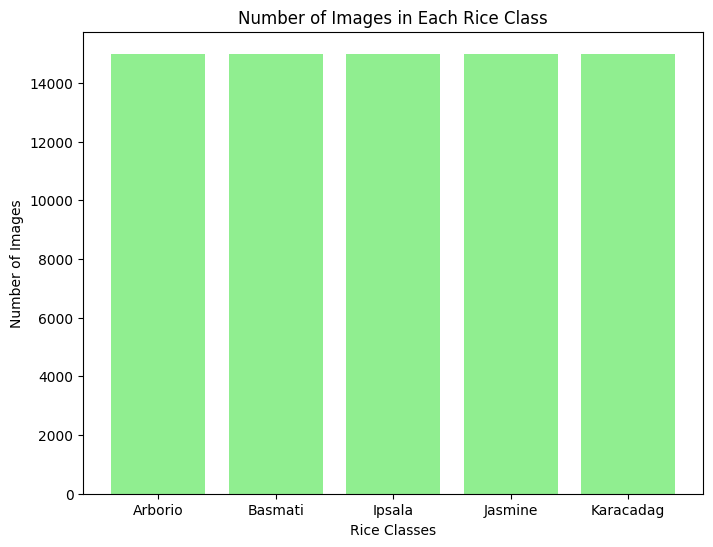

In [6]:
import matplotlib.pyplot as plt

# Define the rice class names and the number of images in each class
rice_classes = ['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']
num_rice_images = [15000, 15000, 15000, 15000, 15000]

# Create the bar graph
plt.figure(figsize=(8, 6))
plt.bar(rice_classes, num_rice_images, color='lightgreen')

# Add labels and title
plt.xlabel('Rice Classes')
plt.ylabel('Number of Images')
plt.title('Number of Images in Each Rice Class')

# Show the graph
plt.show()


In [7]:
import torch
from torch import nn

import torchvision
from torchvision import datasets
from torchvision import transforms
from torchvision.transforms import ToTensor

In [8]:
train_transform = transforms.Compose([
    transforms.Resize((32, 32)),               # Resize images to 32x32
    transforms.Grayscale(num_output_channels=1),  # Convert to grayscale (1 channel)
    transforms.RandomHorizontalFlip(),         # Randomly flip images horizontally
    transforms.ToTensor(),                     # Convert images to PyTorch tensors (C, H, W)
    transforms.Normalize([0.5], [0.5])         # Normalize grayscale images with mean=0.5, std=0.5
])

In [9]:
test_transform = transforms.Compose([
    transforms.Resize((32,32)),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Normalize([0.5],[0.5])
])

In [10]:

train_data = datasets.ImageFolder(root=train_dir, transform=train_transform)
test_data = datasets.ImageFolder(root=test_dir, transform=test_transform)

In [11]:
len(train_data), len(test_data)

(60000, 15000)

In [12]:
class_names =train_data.classes
class_names

['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']

In [13]:
class_to_idx = train_data.class_to_idx
print(class_to_idx)


{'Arborio': 0, 'Basmati': 1, 'Ipsala': 2, 'Jasmine': 3, 'Karacadag': 4}


In [14]:
train_data.targets

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [15]:
image,label=train_data[0]
image

tensor([[[-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -0.9922, -0.9843, -0.9843],
         ...,
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
         [-1.0000, -1.0000, -0.9922,  ..., -1.0000, -1.0000, -1.0000]]])

In [16]:
image.shape,label

(torch.Size([1, 32, 32]), 0)

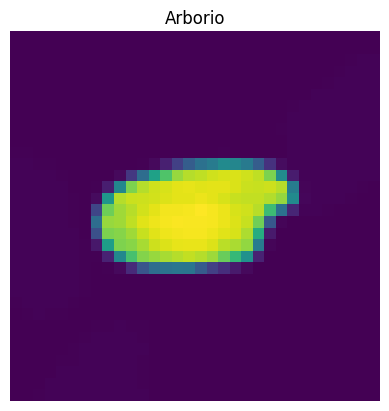

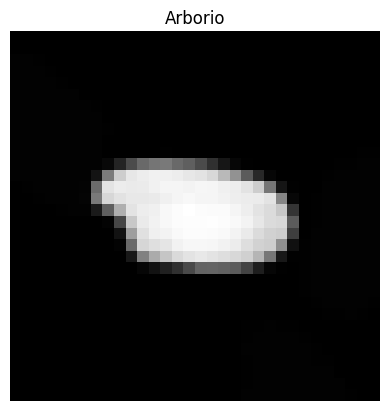

In [17]:
image,label=train_data[0]
image = image.permute(1, 2, 0)
plt.imshow(image.squeeze())
plt.title(class_names[label])
plt.axis("off")
plt.show()


image,label=train_data[0]
image = image.permute(1, 2, 0)
plt.imshow(image.squeeze(),cmap = 'gray')
plt.title(class_names[label])
plt.axis("off")
plt.show()

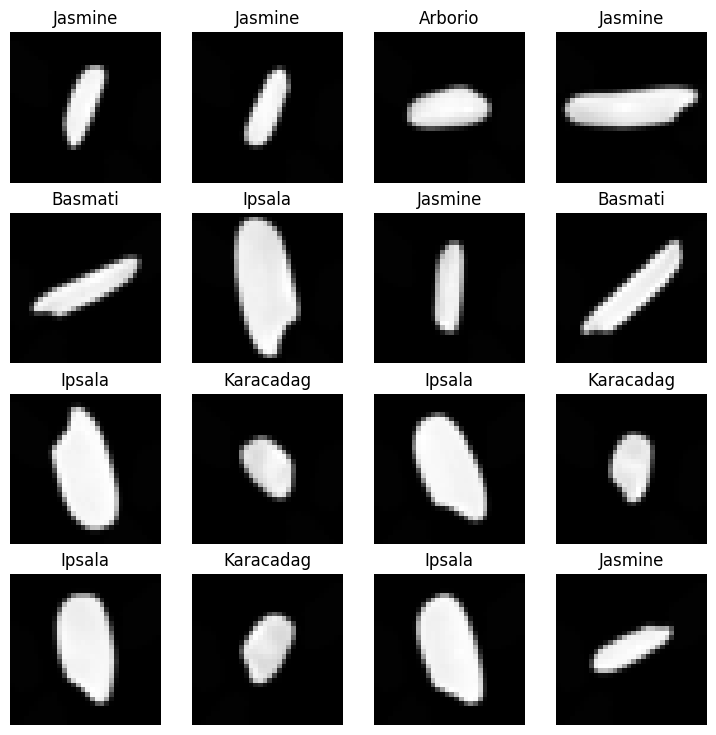

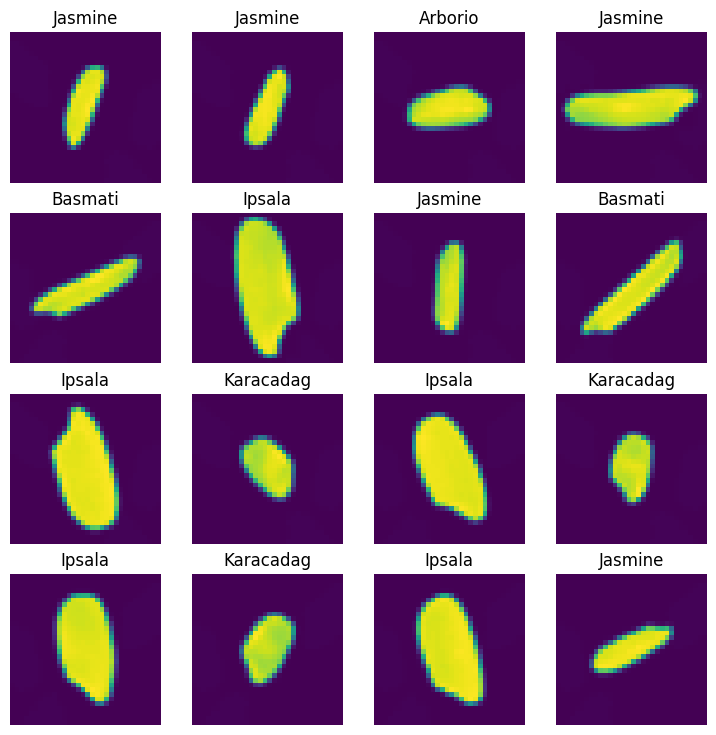

In [18]:
torch.manual_seed(42)
fig=plt.figure(figsize=(9,9))
rows,cols=4,4
for i in range(1,rows*cols+1):
    random_idx=torch.randint(0,len(train_data),size=[1]).item()
    img,label=train_data[random_idx]
    fig.add_subplot(rows,cols,i)
    img=img.permute(1,2,0)
    plt.imshow(img,cmap='gray')
    plt.title(class_names[label])
    plt.axis("off")
plt.show()


torch.manual_seed(42)
fig=plt.figure(figsize=(9,9))
rows,cols=4,4
for i in range(1,rows*cols+1):
    random_idx=torch.randint(0,len(train_data),size=[1]).item()
    img,label=train_data[random_idx]
    fig.add_subplot(rows,cols,i)
    img=img.permute(1,2,0)
    plt.imshow(img)
    plt.title(class_names[label])
    plt.axis("off")
plt.show()

In [19]:
from torch.utils.data import DataLoader

BATCH_SIZE=32

train_dataloader=DataLoader(dataset=train_data,batch_size=BATCH_SIZE,shuffle=True)
test_dataloader=DataLoader(dataset=test_data,batch_size=BATCH_SIZE,shuffle=False)

train_dataloader,test_dataloader

(<torch.utils.data.dataloader.DataLoader at 0x1a33f398190>,
 <torch.utils.data.dataloader.DataLoader at 0x1a33ff62690>)

In [20]:
train_features_batch,train_labels_batch=next(iter(train_dataloader))
train_features_batch.shape,train_labels_batch.shape

(torch.Size([32, 1, 32, 32]), torch.Size([32]))

In [151]:
y_train =[]
y_test = []

for batch_images, batch_labels in train_dataloader:
    for label in batch_labels:
        y_train.append(label)
y_train=np.array(y_train)

for batch_images, batch_labels in test_dataloader:
    for label in batch_labels:
        y_test.append(label)
y_test=np.array(y_test)


In [22]:
y_train

array([2, 0, 4, ..., 4, 1, 0], dtype=int64)

In [23]:
print(class_names)

['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']


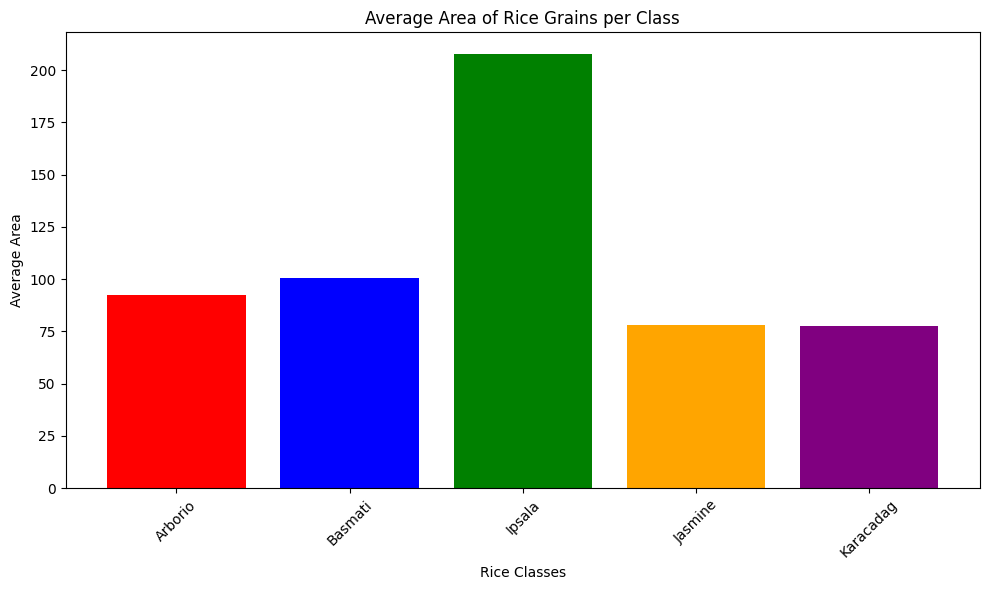

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops
from skimage.segmentation import clear_border
from skimage.transform import resize

def extract_area_per_class(dataloader, class_names):
    X_train_areas = []
    """Extracts the area of images for each class from the dataloader."""
    class_areas = {class_name: [] for class_name in class_names}
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor, label in zip(images, labels):
            img_np = img_tensor.permute(1, 2, 0).numpy()  # Convert to HWC format
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np  # Handle grayscale
            img_resized = resize(img_np, (32, 32))
            
            # Thresholding and cleaning
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            # Measure properties
            props = regionprops(binary_img.astype(int))
            if props:
                area = props[0].area
            else:
                area = 0
            
            class_areas[class_names[label.item()]].append(area)
            X_train_areas.append(area)
    
    return class_areas,np.array(X_train_areas)

# Extract areas for the training set
class_areas,X_train_areas = extract_area_per_class(train_dataloader, class_names)
class_areas_test,X_test_areas = extract_area_per_class(test_dataloader, class_names)

# Calculate average area per class for visualization
avg_areas = {class_name: np.mean(areas) for class_name, areas in class_areas.items()}

# Plot the average areas for each class
plt.figure(figsize=(10, 6))
colors = ['red', 'blue', 'green', 'orange', 'purple']  # Colors for different classes

plt.bar(avg_areas.keys(), avg_areas.values(), color=colors)

# Add labels and title
plt.xlabel('Rice Classes')
plt.ylabel('Average Area')
plt.title('Average Area of Rice Grains per Class')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [25]:
print(X_train_areas)
print(X_train_areas.shape)

[ 74. 181.  86. ... 113.  78.  86.]
(60000,)


In [26]:
X_test_areas.shape

(15000,)

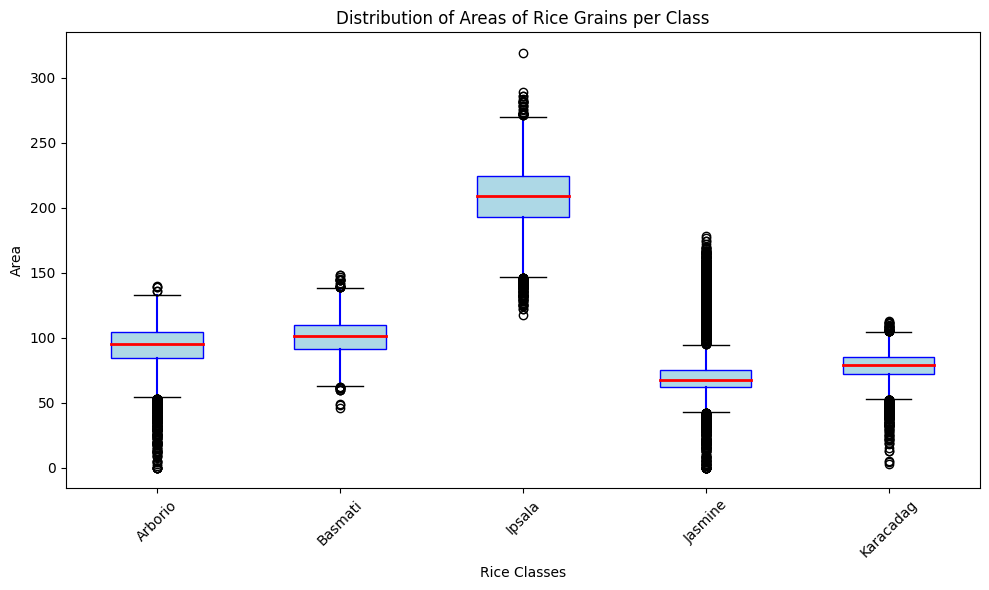

In [27]:
# Create a box plot for each class
plt.figure(figsize=(10, 6))

# Extract data for the box plot
data = [class_areas[class_name] for class_name in class_names]

# Plot the box plot
plt.boxplot(data, labels=class_names, patch_artist=True,
            boxprops=dict(facecolor="lightblue", color="blue"),
            medianprops=dict(color="red", linewidth=2),
            whiskerprops=dict(color="blue", linewidth=1.5))

# Add labels and title
plt.xlabel('Rice Classes')
plt.ylabel('Area')
plt.title('Distribution of Areas of Rice Grains per Class')

# Adjust layout for better appearance
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [28]:
print(class_names)
print(avg_areas)
print(class_areas.keys())

X_class_areas_in_sequence = []
for i in class_areas.keys():
    for j in class_areas[i]:
        X_class_areas_in_sequence.append(j)
        
X_class_areas_in_sequence = np.array(X_class_areas_in_sequence)

['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']
{'Arborio': 92.67375, 'Basmati': 100.43783333333333, 'Ipsala': 207.72558333333333, 'Jasmine': 78.2805, 'Karacadag': 77.80075}
dict_keys(['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag'])


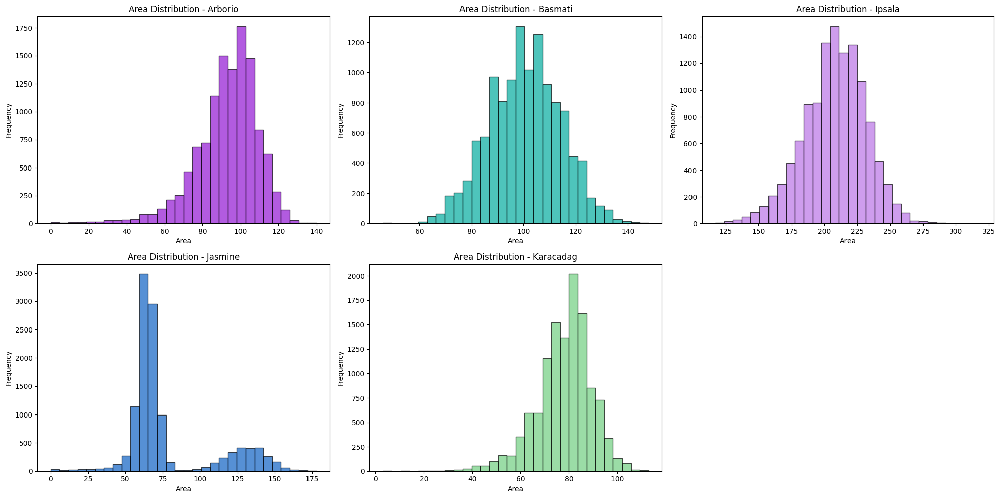

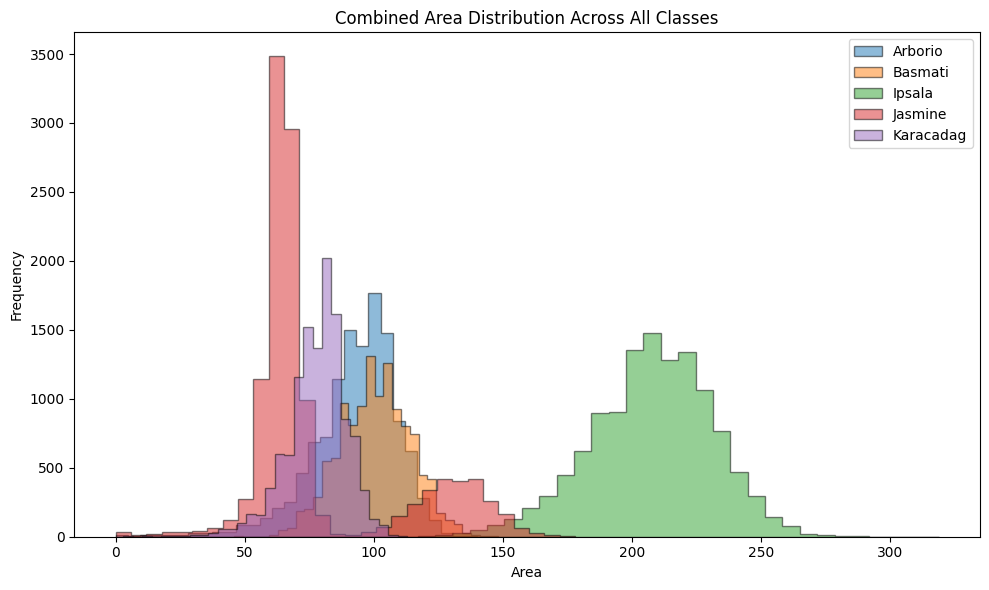

In [29]:
# Plot individual graphs for each class
plt.figure(figsize=(20, 10))

for i, (class_name, areas) in enumerate(class_areas.items(), start=1):
    plt.subplot(2, 3, i)  # Arrange subplots in a 2x3 grid
    plt.hist(areas, bins=30, color=np.random.rand(3,), alpha=0.7, edgecolor='black')
    plt.title(f'Area Distribution - {class_name}')
    plt.xlabel('Area')
    plt.ylabel('Frequency')

# Adjust layout and show individual plots
plt.tight_layout()
plt.show()

# Plot combined graph with all classes
plt.figure(figsize=(10, 6))

for class_name, areas in class_areas.items():
    plt.hist(areas, bins=30, alpha=0.5, label=class_name, edgecolor='black', histtype='stepfilled')

plt.title('Combined Area Distribution Across All Classes')
plt.xlabel('Area')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.tight_layout()

# Show combined plot
plt.show()


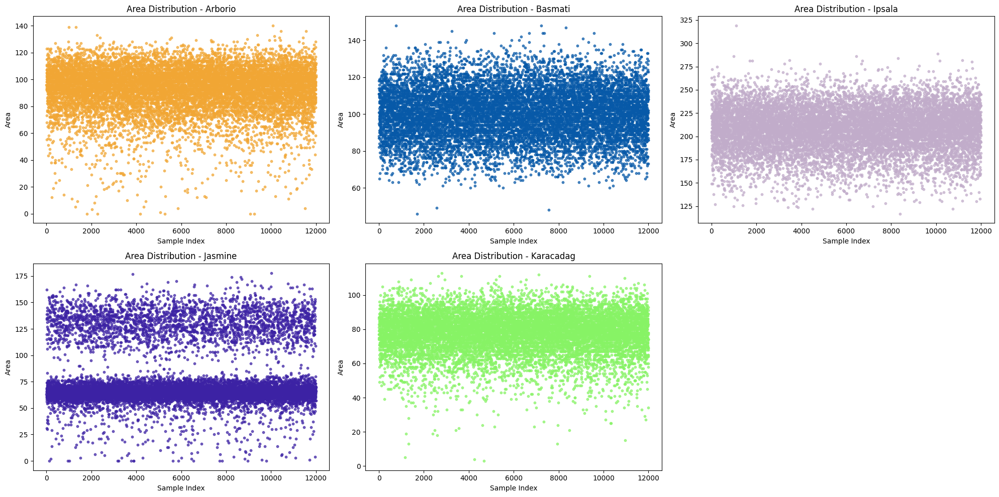

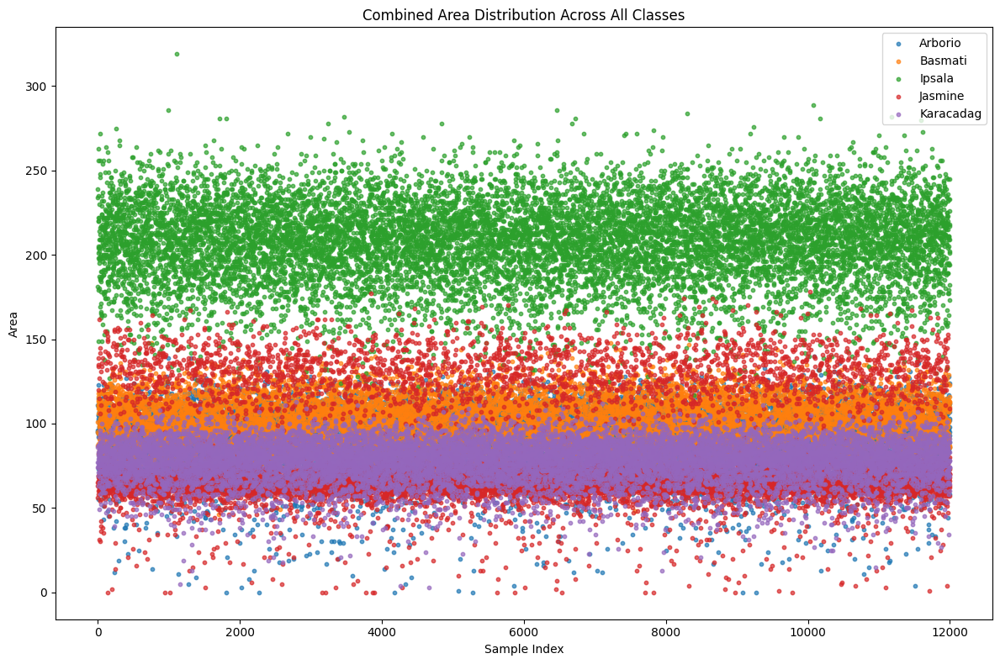

In [30]:
# Scatter plot for individual classes
plt.figure(figsize=(20, 10))

for i, (class_name, areas) in enumerate(class_areas.items(), start=1):
    plt.subplot(2, 3, i)  # Arrange subplots in a 2x3 grid
    plt.scatter(range(len(areas)), areas, alpha=0.7, color=np.random.rand(3,), s=10)
    plt.title(f'Area Distribution - {class_name}')
    plt.xlabel('Sample Index')
    plt.ylabel('Area')

# Adjust layout and show individual plots
plt.tight_layout()
plt.show()

# Scatter plot for combined data
plt.figure(figsize=(12, 8))

for class_name, areas in class_areas.items():
    plt.scatter(range(len(areas)), areas, alpha=0.7, label=class_name, s=10)

plt.title('Combined Area Distribution Across All Classes')
plt.xlabel('Sample Index')
plt.ylabel('Area')
plt.legend(loc='upper right')
plt.tight_layout()

# Show combined plot
plt.show()


In [31]:

def extract_perimeter_from_dataloader(dataloader):
    perimeter_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                perimeter = props[0].perimeter
                perimeter_list.append(perimeter)
            else:
                perimeter_list.append(0)
    
    return perimeter_list


In [32]:
# Step 1: Organize perimeter values by class
X_train_perimeter = []
class_perimeters = {class_name: [] for class_name in train_data.classes}

for i, (images, labels) in enumerate(train_dataloader):
    for img, label in zip(images, labels):
        class_name = train_data.classes[label]
        img_np = img.permute(1, 2, 0).numpy()
        img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
        img_resized = resize(img_np, (32, 32))
        
        binary_img = img_resized > 0.5
        binary_img = clear_border(binary_img)
        
        props = regionprops(binary_img.astype(int))
        perimeter = props[0].perimeter if props else 0
        
        class_perimeters[class_name].append(perimeter)
        X_train_perimeter.append(perimeter)
        
X_train_perimeter = np.array(X_train_perimeter)


In [33]:
# Step 1: Organize perimeter values by class
X_test_perimeter = []
class_perimeters_test = {class_name: [] for class_name in test_data.classes}

for i, (images, labels) in enumerate(test_dataloader):
    for img, label in zip(images, labels):
        class_name = train_data.classes[label]
        img_np = img.permute(1, 2, 0).numpy()
        img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
        img_resized = resize(img_np, (32, 32))
        
        binary_img = img_resized > 0.5
        binary_img = clear_border(binary_img)
        
        props = regionprops(binary_img.astype(int))
        perimeter = props[0].perimeter if props else 0
        
        class_perimeters_test[class_name].append(perimeter)
        X_test_perimeter.append(perimeter)
        
X_test_perimeter = np.array(X_test_perimeter)

In [34]:
print(class_names)
print(class_perimeters.keys())

['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']
dict_keys(['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag'])


In [35]:
X_test_perimeter.shape

(15000,)

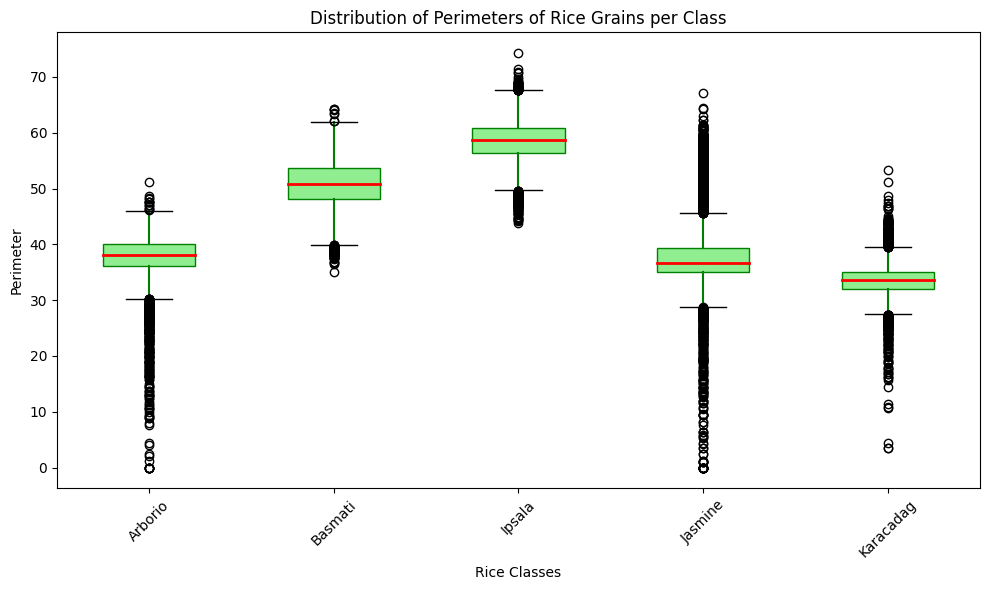

In [36]:
import matplotlib.pyplot as plt

# Create a box plot for the perimeter values of each class
plt.figure(figsize=(10, 6))

# Extract data for the box plot
perimeter_data = [class_perimeters[class_name] for class_name in train_data.classes]

# Plot the box plot
plt.boxplot(perimeter_data, labels=train_data.classes, patch_artist=True,
            boxprops=dict(facecolor="lightgreen", color="green"),
            medianprops=dict(color="red", linewidth=2),
            whiskerprops=dict(color="green", linewidth=1.5))

# Add labels and title
plt.xlabel('Rice Classes')
plt.ylabel('Perimeter')
plt.title('Distribution of Perimeters of Rice Grains per Class')

# Adjust layout for better appearance
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [37]:
X_class_perimeter_in_sequence = []
for i in class_perimeters.keys():
    for j in class_perimeters[i]:
        X_class_perimeter_in_sequence.append(j)
        
X_class_perimeter_in_sequence = np.array(X_class_perimeter_in_sequence)

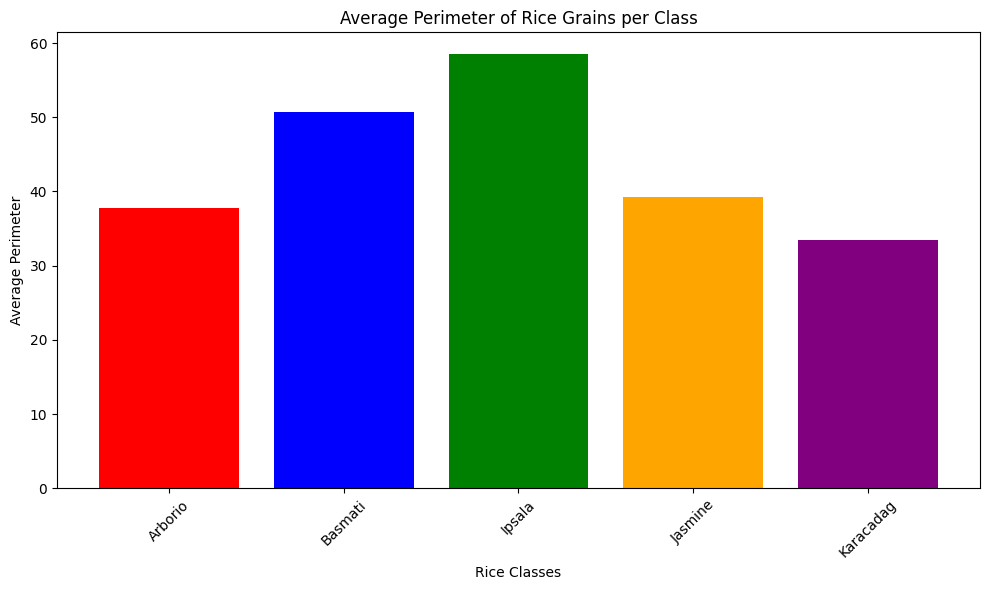

In [38]:
# Calculate average area per class for visualization
avg_perimeters = {class_name: np.mean(areas) for class_name, areas in class_perimeters.items()}

# Plot the average areas for each class
plt.figure(figsize=(10, 6))
colors = ['red', 'blue', 'green', 'orange', 'purple']  # Colors for different classes

plt.bar(avg_perimeters.keys(), avg_perimeters.values(), color=colors)

# Add labels and title
plt.xlabel('Rice Classes')
plt.ylabel('Average Perimeter')
plt.title('Average Perimeter of Rice Grains per Class')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

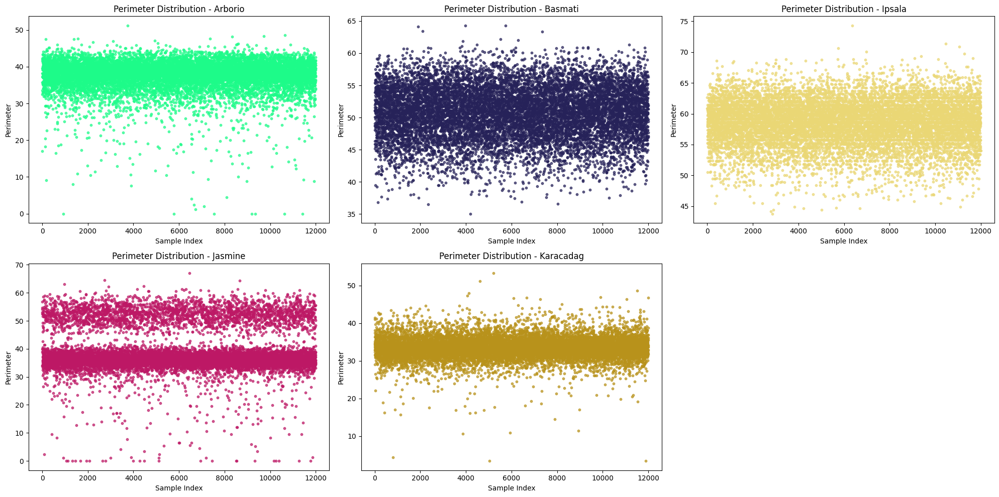

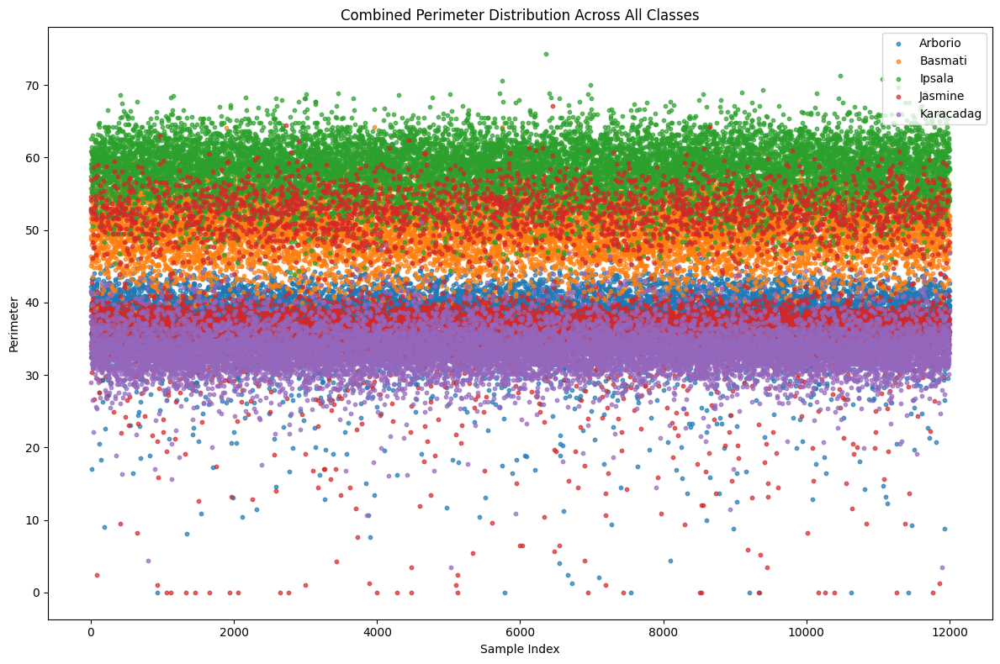

In [39]:
# Step 2: Plot individual scatter plots for each class
plt.figure(figsize=(20, 10))

for i, (class_name, perimeters) in enumerate(class_perimeters.items(), start=1):
    plt.subplot(2, 3, i)  # Arrange subplots in a 2x3 grid
    plt.scatter(range(len(perimeters)), perimeters, alpha=0.7, color=np.random.rand(3,), s=10)
    plt.title(f'Perimeter Distribution - {class_name}')
    plt.xlabel('Sample Index')
    plt.ylabel('Perimeter')

# Adjust layout and show individual plots
plt.tight_layout()
plt.show()

# Step 3: Plot combined scatter plot
plt.figure(figsize=(12, 8))

for class_name, perimeters in class_perimeters.items():
    plt.scatter(range(len(perimeters)), perimeters, alpha=0.7, label=class_name, s=10)

plt.title('Combined Perimeter Distribution Across All Classes')
plt.xlabel('Sample Index')
plt.ylabel('Perimeter')
plt.legend(loc='upper right')
plt.tight_layout()

# Show combined plot
plt.show()

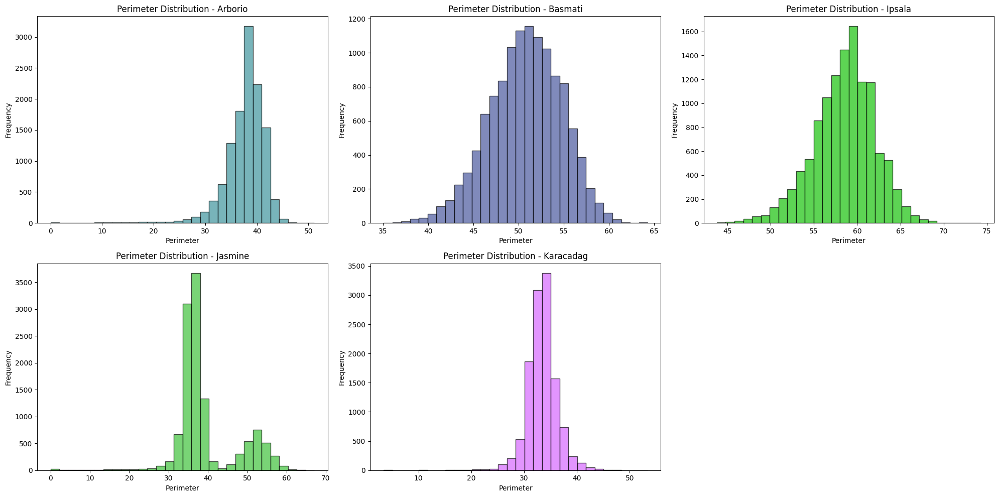

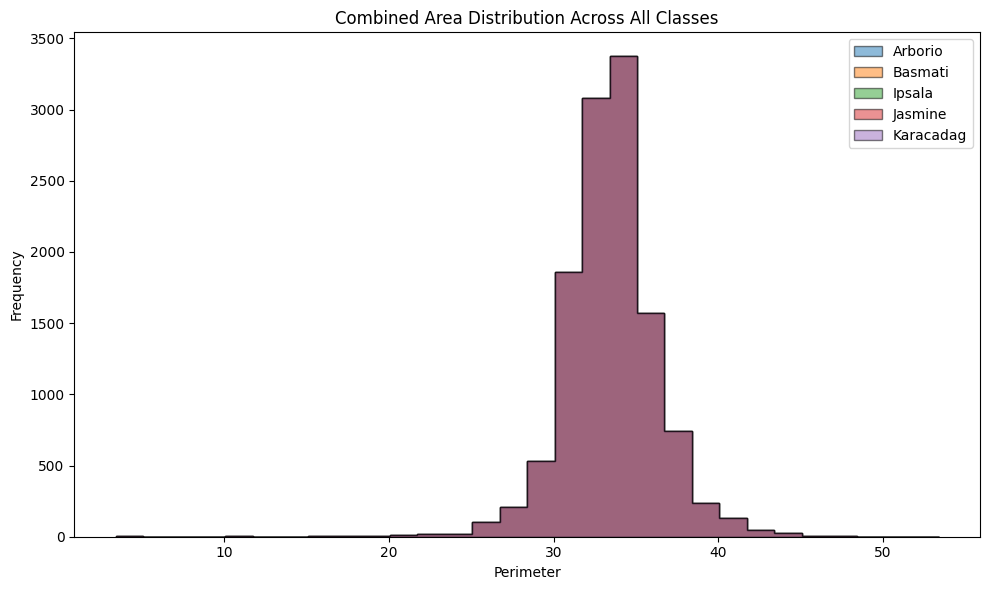

In [40]:
# Plot individual graphs for each class
plt.figure(figsize=(20, 10))

for i, (class_name, perimeters) in enumerate(class_perimeters.items(), start=1):
    plt.subplot(2, 3, i)  # Arrange subplots in a 2x3 grid
    plt.hist(perimeters, bins=30, color=np.random.rand(3,), alpha=0.7, edgecolor='black')
    plt.title(f'Perimeter Distribution - {class_name}')
    plt.xlabel('Perimeter')
    plt.ylabel('Frequency')

# Adjust layout and show individual plots
plt.tight_layout()
plt.show()

# Plot combined graph with all classes
plt.figure(figsize=(10, 6))

for class_name, areas in class_areas.items():
    plt.hist(perimeters, bins=30, alpha=0.5, label=class_name, edgecolor='black', histtype='stepfilled')

plt.title('Combined Area Distribution Across All Classes')
plt.xlabel('Perimeter')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.tight_layout()

# Show combined plot
plt.show()


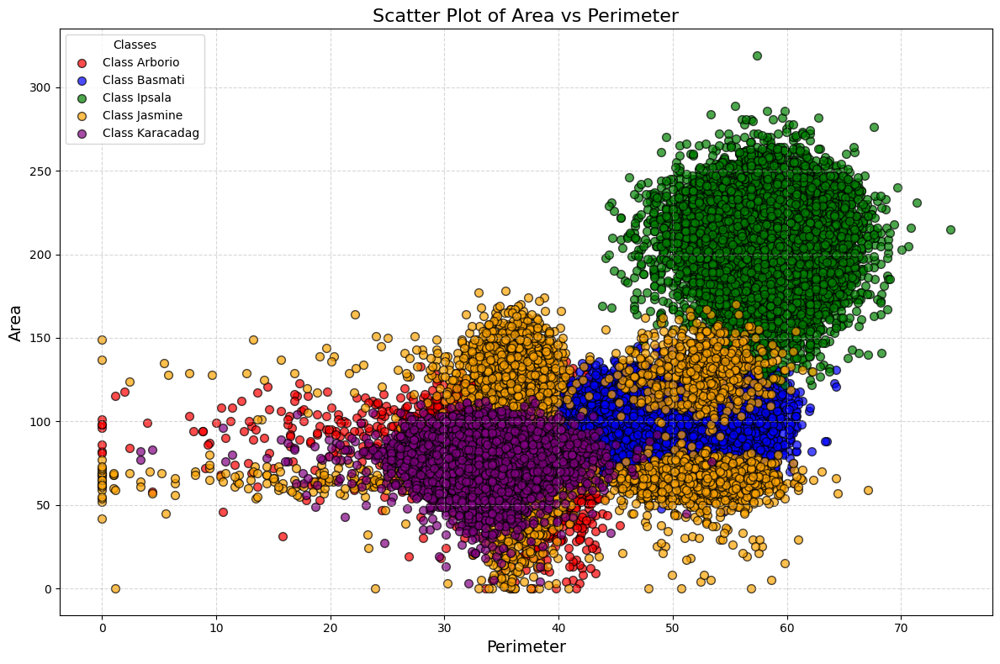

In [233]:
import matplotlib.pyplot as plt
import numpy as np

# Define a color map for each class
color_map = {
    "Arborio": 'red',
    "Basmati": 'blue',
    "Ipsala": 'green',
    "Jasmine": 'orange',
    "Karacadag": 'purple'
}

def plot_area_vs_perimeter(class_areas, class_perimeters):
    plt.figure(figsize=(12, 8))
    
    for class_name in class_areas.keys():
        if class_name in class_perimeters:  # Ensure both area and perimeter are available for the class
            areas = class_areas[class_name]
            perimeters = class_perimeters[class_name]
            
            # Scatter plot for the current class
            plt.scatter(
                perimeters, areas, 
                label=f'Class {class_name}', 
                color=color_map.get(class_name, 'black'),  # Use color map or default to black
                alpha=0.7, s=50, edgecolor='k'
            )
    
    # Add titles and labels
    plt.title('Scatter Plot of Area vs Perimeter', fontsize=16)
    plt.xlabel('Perimeter', fontsize=14)
    plt.ylabel('Area', fontsize=14)
    plt.legend(title="Classes", fontsize=10, loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


# Call the function
plot_area_vs_perimeter(class_areas, class_perimeters)


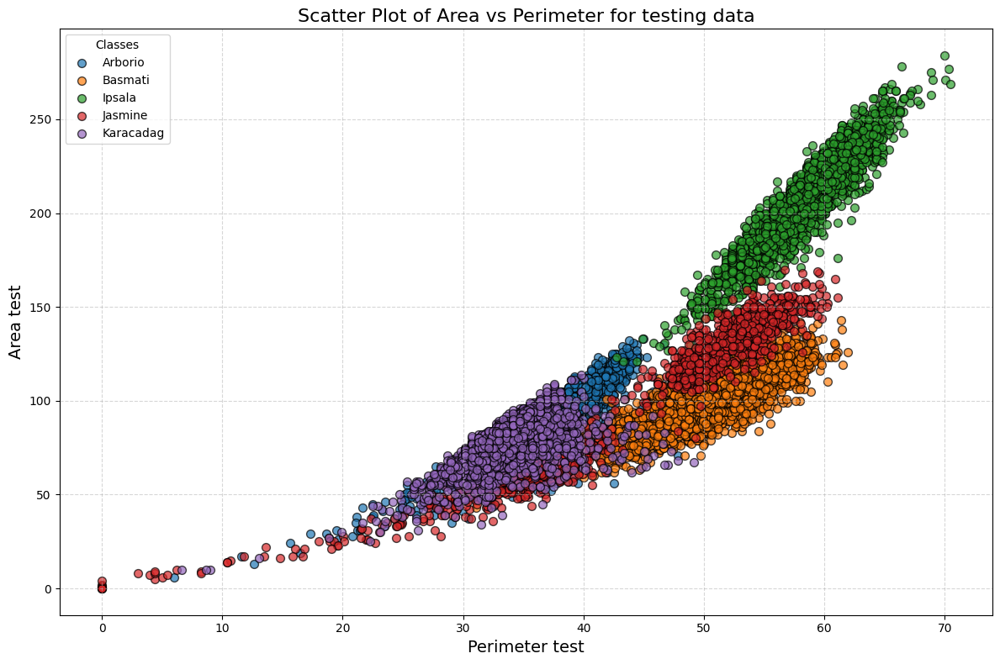

In [42]:
import matplotlib.pyplot as plt
import numpy as np


def plot_area_vs_perimeter_for_test(class_areas, class_perimeters):
    plt.figure(figsize=(12, 8))
    
    for class_name in class_areas.keys():
        if class_name in class_perimeters:  # Ensure both area and perimeter are available for the class
            areas = class_areas[class_name]
            perimeters = class_perimeters[class_name]
            
            # Scatter plot for the current class
            plt.scatter(
                perimeters, areas, label=class_name, 
                alpha=0.7, s=50, edgecolor='k'
            )
    
    # Add titles and labels
    plt.title('Scatter Plot of Area vs Perimeter for testing data', fontsize=16)
    plt.xlabel('Perimeter test', fontsize=14)
    plt.ylabel('Area test', fontsize=14)
    plt.legend(title="Classes", fontsize=10, loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# Call the function with your dictionaries
plot_area_vs_perimeter_for_test(class_areas_test, class_perimeters_test)


In [43]:
def extract_axis_lengths_from_dataloader(dataloader):
    X_train_major_axis = []
    X_train_minor_axis = []
    class_major_axes = {}
    class_minor_axes = {}
    
    for batch in dataloader:
        images, labels = batch
        
        for img_tensor, label in zip(images, labels):
            # Convert tensor to numpy
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            
            # Resize and binarize image
            img_resized = resize(img_np, (32, 32))
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            # Extract region properties
            props = regionprops(binary_img.astype(int))
            major_axis_length = props[0].major_axis_length if props else 0
            minor_axis_length = props[0].minor_axis_length if props else 0
            
            # Get class name
            class_name = class_names[label.item()]
            
            # Initialize class lists if not already present
            if class_name not in class_major_axes:
                class_major_axes[class_name] = []
                class_minor_axes[class_name] = []
            
            # Append lengths
            class_major_axes[class_name].append(major_axis_length)
            class_minor_axes[class_name].append(minor_axis_length)
            
            X_train_major_axis.append(major_axis_length)
            X_train_minor_axis.append(minor_axis_length)
    
    return class_major_axes, class_minor_axes,np.array(X_train_major_axis),np.array(X_train_minor_axis)

# Extract lengths for training and test datasets
train_class_major_axes, train_class_minor_axes,X_train_major_axis,X_train_minor_axis = extract_axis_lengths_from_dataloader(train_dataloader)


In [44]:
# Extract lengths for training and test datasets
test_class_major_axes, test_class_minor_axes,X_test_major_axis,X_test_minor_axis = extract_axis_lengths_from_dataloader(test_dataloader)

In [45]:
print(class_names)
print(train_class_major_axes.keys())

['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']
dict_keys(['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag'])


In [46]:
print(class_names)
print(train_class_minor_axes.keys())

['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']
dict_keys(['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag'])


In [47]:
print(X_test_major_axis.shape)
print(X_test_minor_axis.shape)

(15000,)
(15000,)


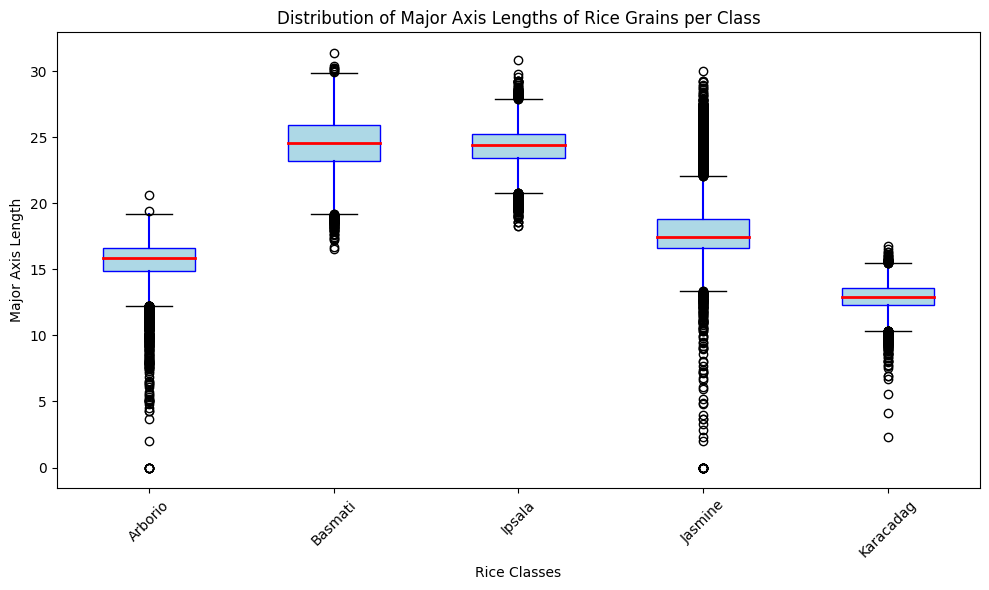

In [48]:
import matplotlib.pyplot as plt

# Create a box plot for the major axis lengths
plt.figure(figsize=(10, 6))

# Extract data for the box plot
major_axis_data = [train_class_major_axes[class_name] for class_name in class_names]

# Plot the box plot
plt.boxplot(major_axis_data, labels=class_names, patch_artist=True,
            boxprops=dict(facecolor="lightblue", color="blue"),
            medianprops=dict(color="red", linewidth=2),
            whiskerprops=dict(color="blue", linewidth=1.5))

# Add labels and title
plt.xlabel('Rice Classes')
plt.ylabel('Major Axis Length')
plt.title('Distribution of Major Axis Lengths of Rice Grains per Class')

# Adjust layout
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


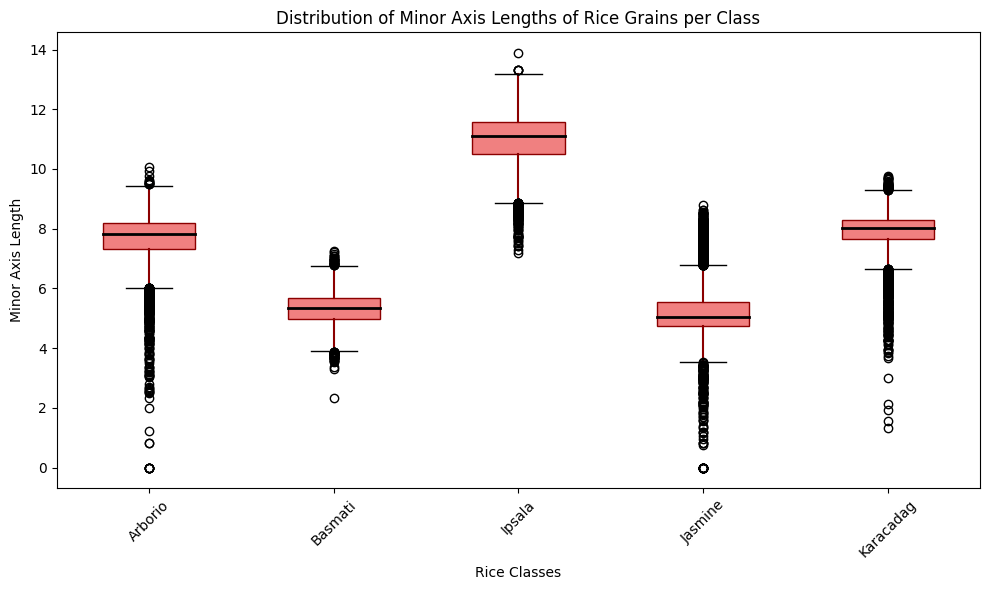

In [49]:
# Create a box plot for the minor axis lengths
plt.figure(figsize=(10, 6))

# Extract data for the box plot
minor_axis_data = [train_class_minor_axes[class_name] for class_name in class_names]

# Plot the box plot
plt.boxplot(minor_axis_data, labels=class_names, patch_artist=True,
            boxprops=dict(facecolor="lightcoral", color="darkred"),
            medianprops=dict(color="black", linewidth=2),
            whiskerprops=dict(color="darkred", linewidth=1.5))

# Add labels and title
plt.xlabel('Rice Classes')
plt.ylabel('Minor Axis Length')
plt.title('Distribution of Minor Axis Lengths of Rice Grains per Class')

# Adjust layout
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


In [50]:
X_major_axis_in_sequence = []
for i in train_class_major_axes.keys():
    for j in train_class_major_axes[i]:
        X_major_axis_in_sequence.append(j)
        
X_major_axis_in_sequence = np.array(X_major_axis_in_sequence)

X_minor_axis_in_sequence = []
for i in train_class_minor_axes.keys():
    for j in train_class_minor_axes[i]:
        X_minor_axis_in_sequence.append(j)
        
X_minor_axis_in_sequence = np.array(X_minor_axis_in_sequence)

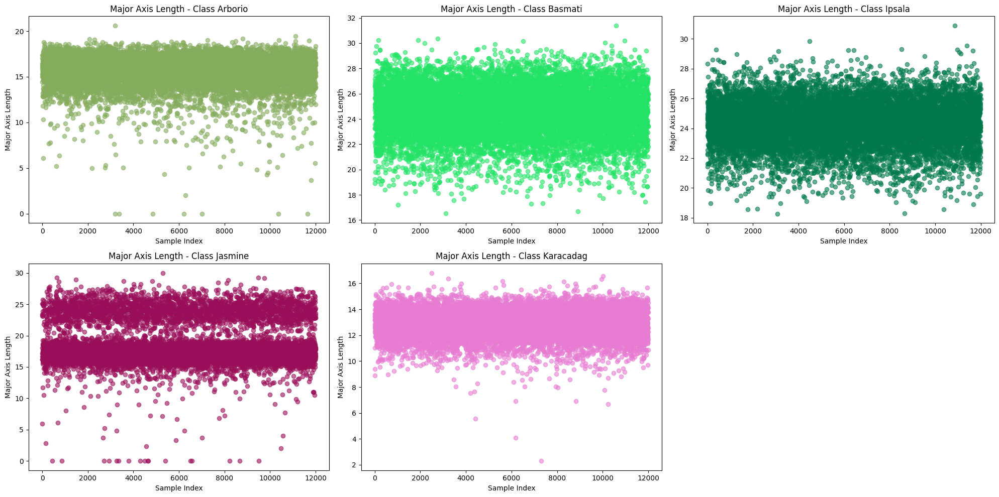

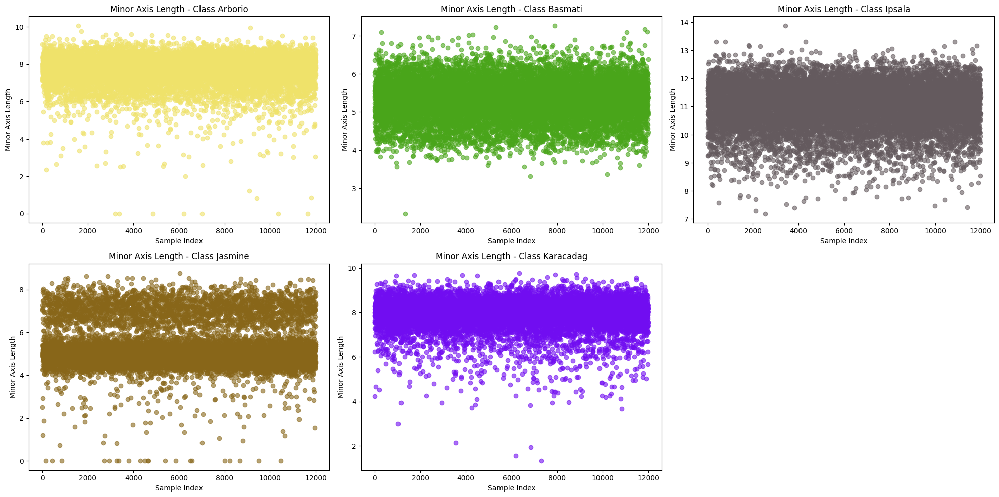

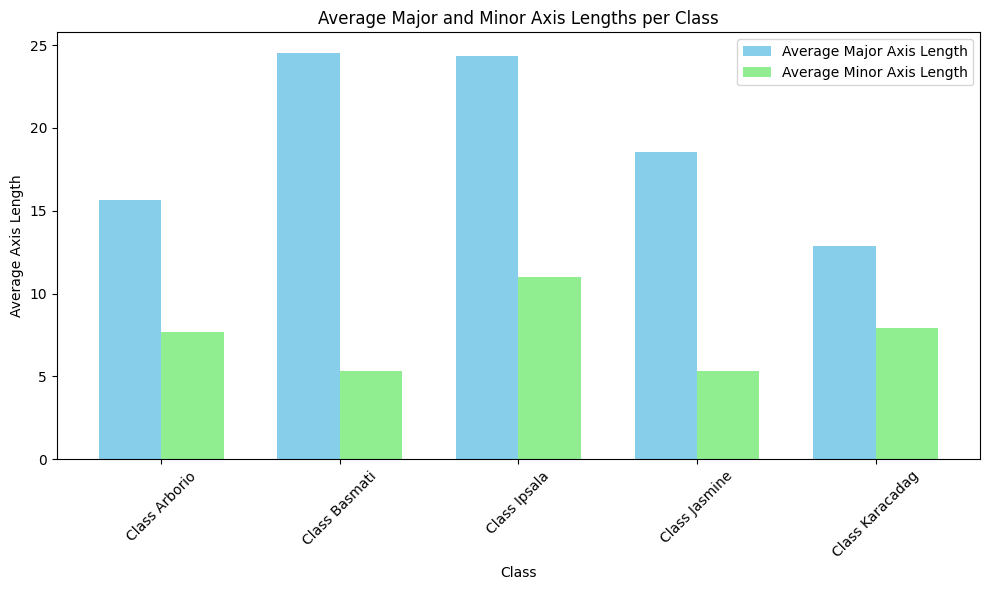

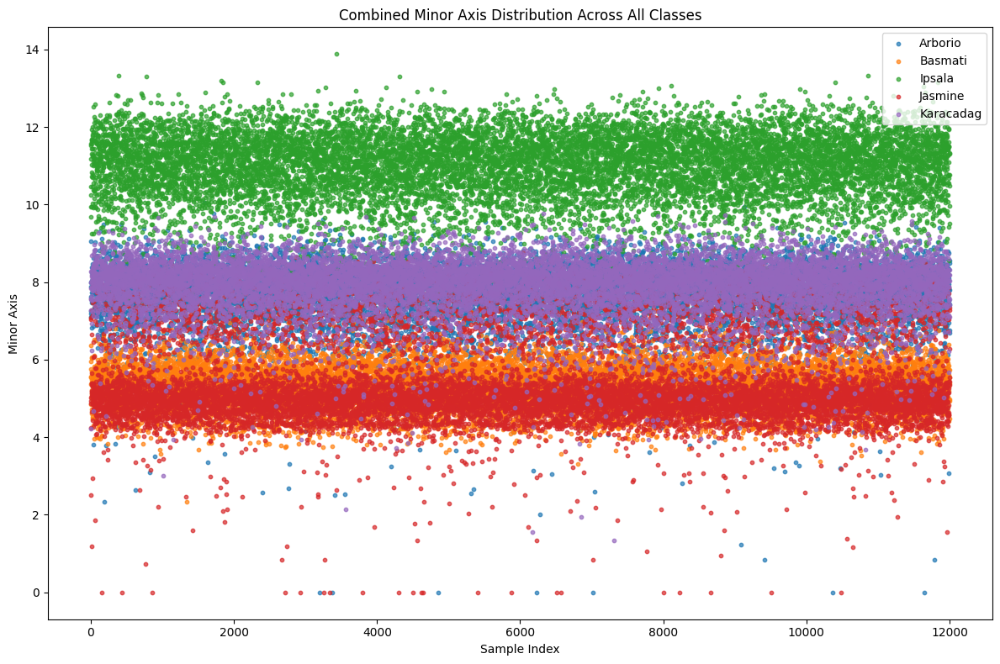

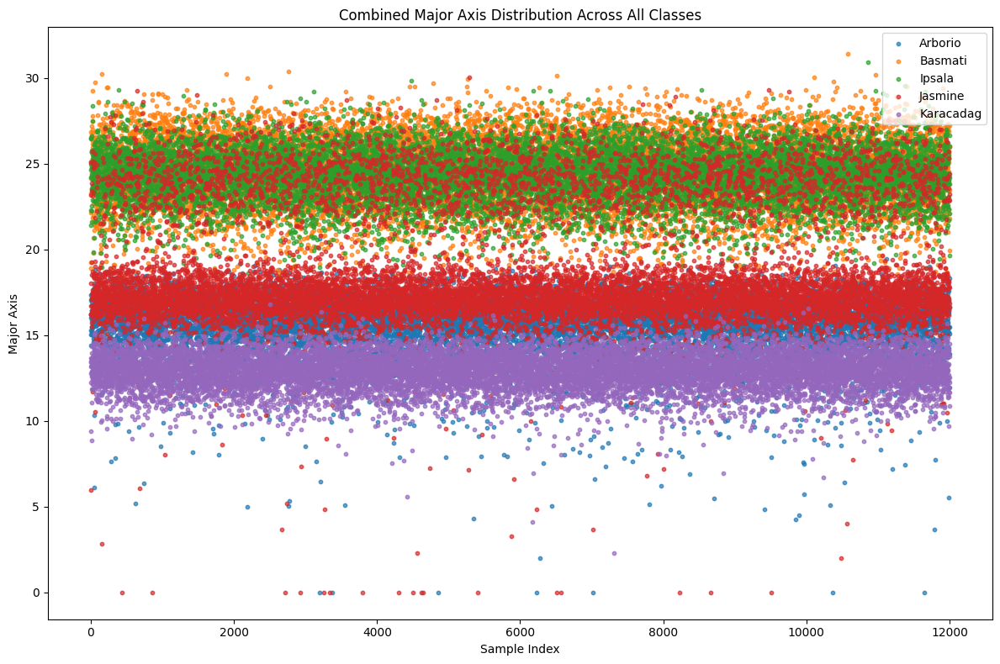

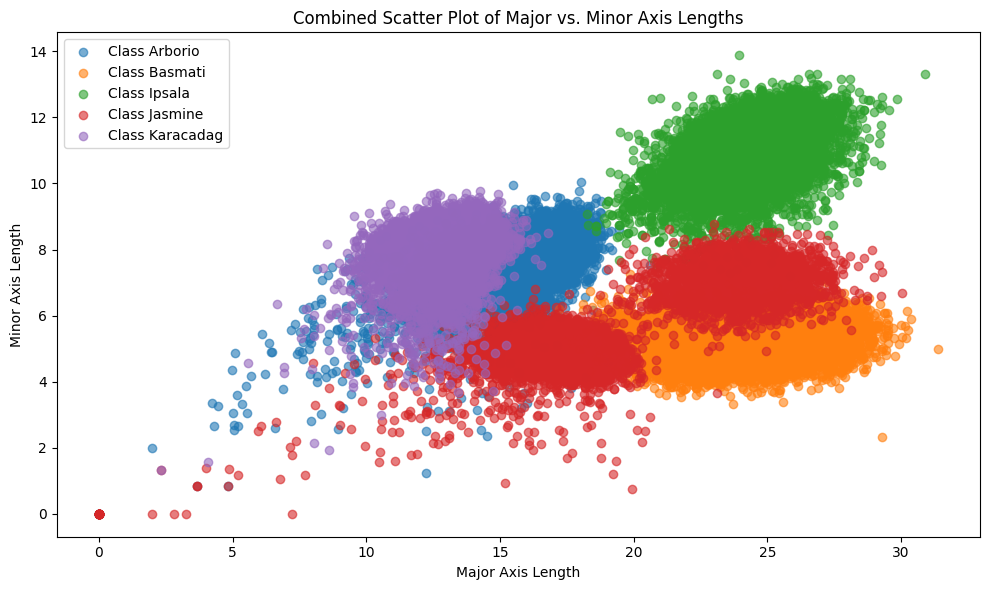

In [51]:
import matplotlib.pyplot as plt
import numpy as np

# Step 2: Calculate Average Axis Length and Plot Scatter and Bar Graphs
def plot_axis_lengths(class_major_axes, class_minor_axes):
    
    # Step 2.1: Scatter Plots for Major and Minor Axis Lengths
    plt.figure(figsize=(20, 10))

    for i, (class_name, major_axes) in enumerate(class_major_axes.items(), start=1):
        plt.subplot(2, 3, i)  # Arrange subplots in a 2x3 grid
        plt.scatter(range(len(major_axes)), major_axes, alpha=0.6, label=class_name, color=np.random.rand(3,))
        plt.title(f'Major Axis Length - Class {class_name}')
        plt.xlabel('Sample Index')
        plt.ylabel('Major Axis Length')

    plt.tight_layout()
    plt.show()

    # Scatter plot for Minor Axis Lengths
    plt.figure(figsize=(20, 10))

    for i, (class_name, minor_axes) in enumerate(class_minor_axes.items(), start=1):
        plt.subplot(2, 3, i)  # Arrange subplots in a 2x3 grid
        plt.scatter(range(len(minor_axes)), minor_axes, alpha=0.6, label=class_name, color=np.random.rand(3,))
        plt.title(f'Minor Axis Length - Class {class_name}')
        plt.xlabel('Sample Index')
        plt.ylabel('Minor Axis Length')

    plt.tight_layout()
    plt.show()

    # Step 1: Bar Graph for Average Major and Minor Axis Lengths
    avg_major_axes = {cls: np.mean(lengths) for cls, lengths in class_major_axes.items()}
    avg_minor_axes = {cls: np.mean(lengths) for cls, lengths in class_minor_axes.items()}
    
    classes = list(avg_major_axes.keys())
    avg_major_values = list(avg_major_axes.values())
    avg_minor_values = list(avg_minor_axes.values())
    
    x = np.arange(len(classes))  # Class indices
    bar_width = 0.35
    
    plt.figure(figsize=(10, 6))
    plt.bar(x - bar_width / 2, avg_major_values, width=bar_width, label='Average Major Axis Length', color='skyblue')
    plt.bar(x + bar_width / 2, avg_minor_values, width=bar_width, label='Average Minor Axis Length', color='lightgreen')
    
    plt.title('Average Major and Minor Axis Lengths per Class')
    plt.xlabel('Class')
    plt.ylabel('Average Axis Length')
    plt.xticks(x, [f'Class {cls}' for cls in classes], rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()


    # Step 3: Plot combined scatter plot
    plt.figure(figsize=(12, 8))

    for class_name, minor_axis_ in class_minor_axes.items():
        plt.scatter(range(len(minor_axis_)), minor_axis_, alpha=0.7, label=class_name, s=10)

    plt.title('Combined Minor Axis Distribution Across All Classes')
    plt.xlabel('Sample Index')
    plt.ylabel('Minor Axis')
    plt.legend(loc='upper right')
    plt.tight_layout()

    # Show combined plot
    plt.show()
    
    
    # Step 3: Plot combined scatter plot
    plt.figure(figsize=(12, 8))

    for class_name, major_axes_ in class_major_axes.items():
        plt.scatter(range(len(major_axes_)), major_axes_, alpha=0.7, label=class_name, s=10)

    plt.title('Combined Major Axis Distribution Across All Classes')
    plt.xlabel('Sample Index')
    plt.ylabel('Major Axis')
    plt.legend(loc='upper right')
    plt.tight_layout()

    # Show combined plot
    plt.show()
    
    # Step 2: Combined Scatter Plot for Major and Minor Axis Lengths
    plt.figure(figsize=(10, 6))
    
    for cls in class_major_axes.keys():
        major_axes = class_major_axes[cls]
        minor_axes = class_minor_axes[cls]
        plt.scatter(major_axes, minor_axes, alpha=0.6, label=f'Class {cls}')
    
    plt.title('Combined Scatter Plot of Major vs. Minor Axis Lengths')
    plt.xlabel('Major Axis Length')
    plt.ylabel('Minor Axis Length')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot for the training dataset
plot_axis_lengths(train_class_major_axes, train_class_minor_axes)



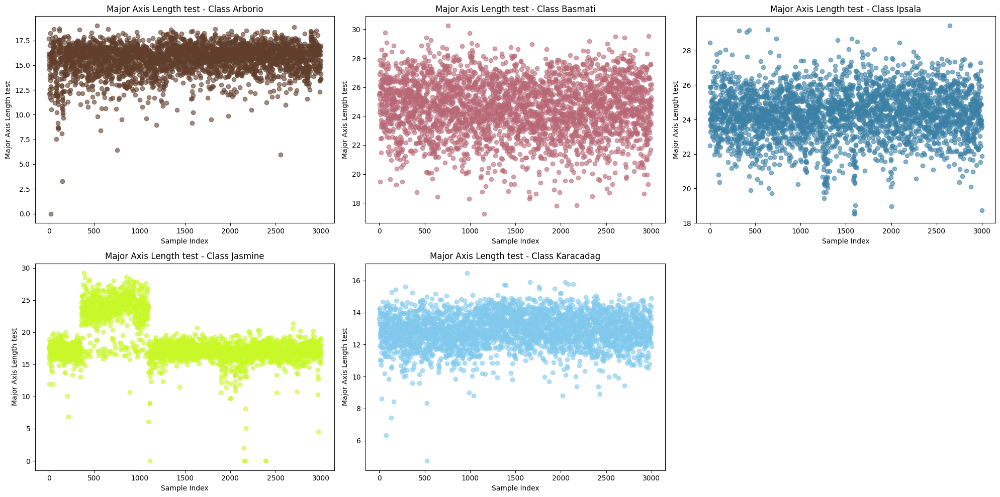

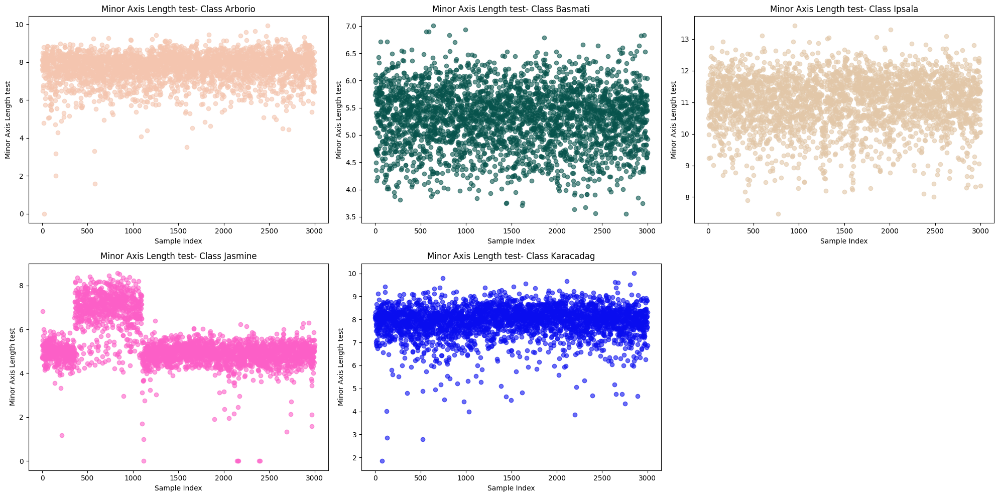

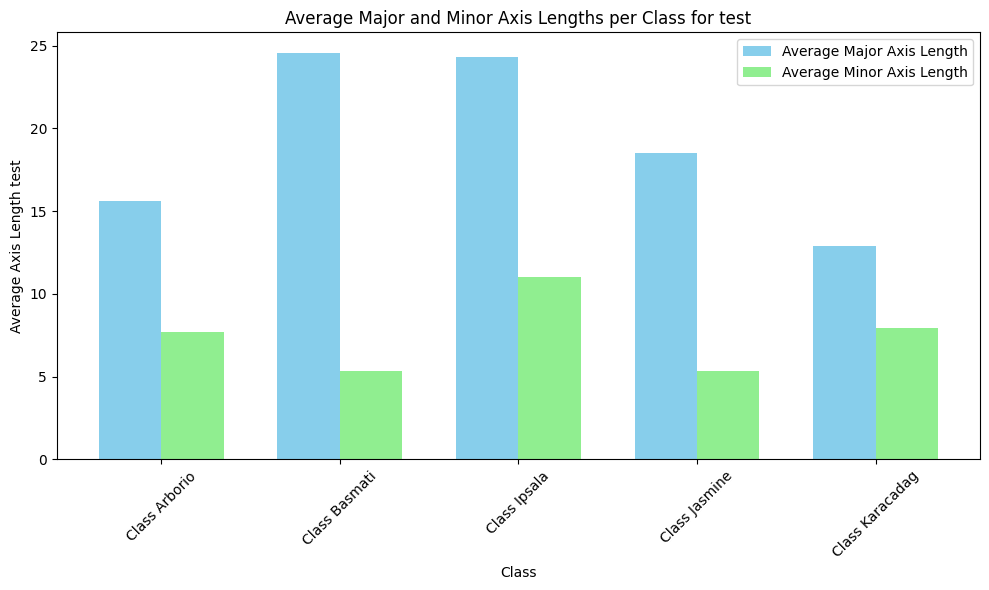

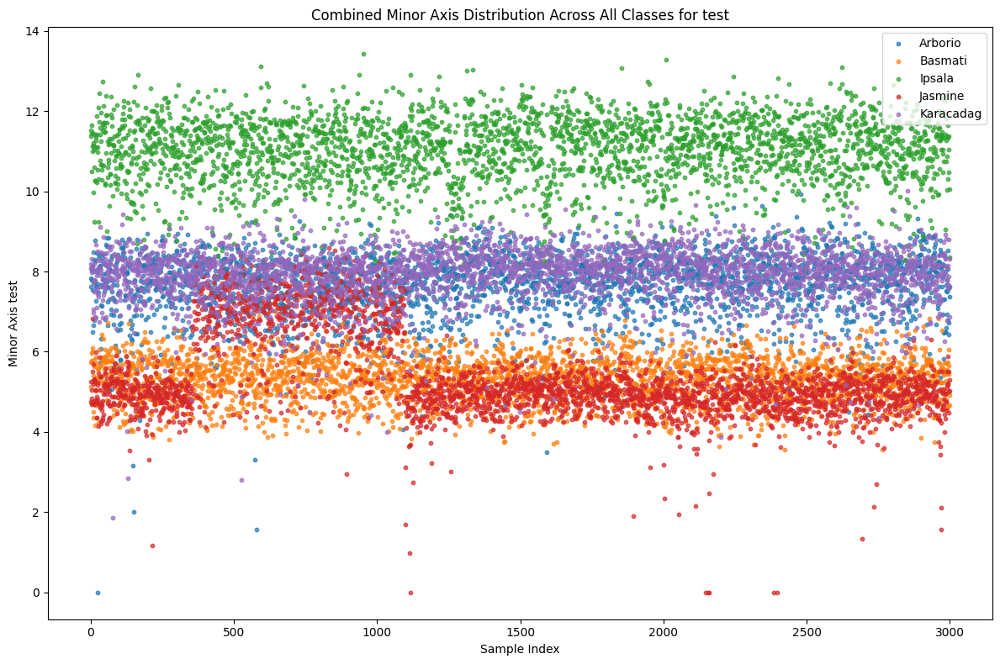

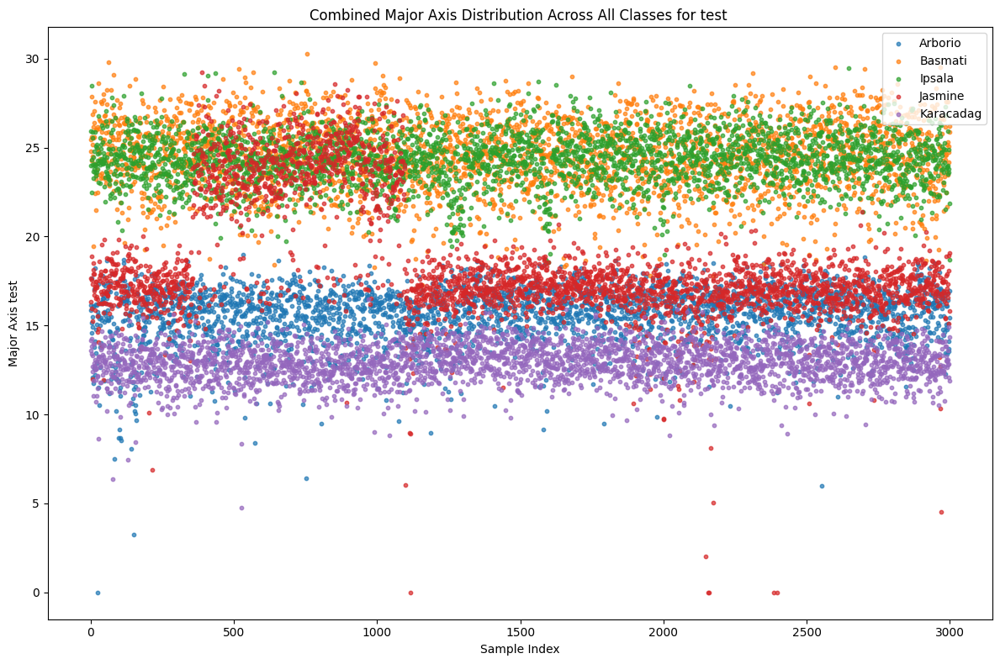

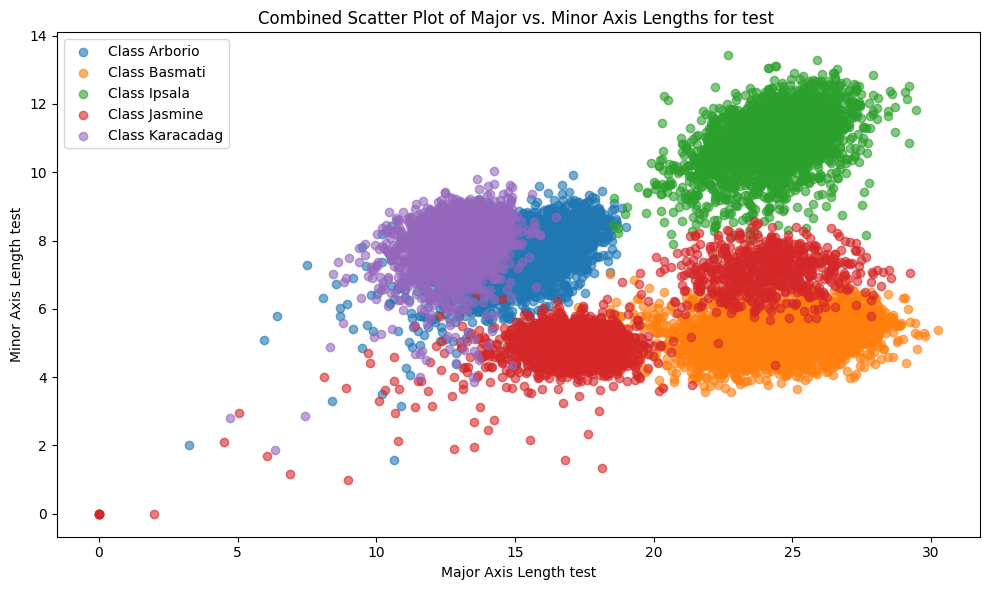

In [52]:
import matplotlib.pyplot as plt
import numpy as np

# Step 2: Calculate Average Axis Length and Plot Scatter and Bar Graphs
def plot_axis_lengths_for_test(class_major_axes, class_minor_axes):
    
    # Step 2.1: Scatter Plots for Major and Minor Axis Lengths
    plt.figure(figsize=(20, 10))

    for i, (class_name, major_axes) in enumerate(class_major_axes.items(), start=1):
        plt.subplot(2, 3, i)  # Arrange subplots in a 2x3 grid
        plt.scatter(range(len(major_axes)), major_axes, alpha=0.6, label=class_name, color=np.random.rand(3,))
        plt.title(f'Major Axis Length test - Class {class_name}')
        plt.xlabel('Sample Index')
        plt.ylabel('Major Axis Length test')

    plt.tight_layout()
    plt.show()

    # Scatter plot for Minor Axis Lengths
    plt.figure(figsize=(20, 10))

    for i, (class_name, minor_axes) in enumerate(class_minor_axes.items(), start=1):
        plt.subplot(2, 3, i)  # Arrange subplots in a 2x3 grid
        plt.scatter(range(len(minor_axes)), minor_axes, alpha=0.6, label=class_name, color=np.random.rand(3,))
        plt.title(f'Minor Axis Length test- Class {class_name}')
        plt.xlabel('Sample Index')
        plt.ylabel('Minor Axis Length test')

    plt.tight_layout()
    plt.show()

    # Step 1: Bar Graph for Average Major and Minor Axis Lengths
    avg_major_axes = {cls: np.mean(lengths) for cls, lengths in class_major_axes.items()}
    avg_minor_axes = {cls: np.mean(lengths) for cls, lengths in class_minor_axes.items()}
    
    classes = list(avg_major_axes.keys())
    avg_major_values = list(avg_major_axes.values())
    avg_minor_values = list(avg_minor_axes.values())
    
    x = np.arange(len(classes))  # Class indices
    bar_width = 0.35
    
    plt.figure(figsize=(10, 6))
    plt.bar(x - bar_width / 2, avg_major_values, width=bar_width, label='Average Major Axis Length', color='skyblue')
    plt.bar(x + bar_width / 2, avg_minor_values, width=bar_width, label='Average Minor Axis Length', color='lightgreen')
    
    plt.title('Average Major and Minor Axis Lengths per Class for test')
    plt.xlabel('Class')
    plt.ylabel('Average Axis Length test')
    plt.xticks(x, [f'Class {cls}' for cls in classes], rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()


    # Step 3: Plot combined scatter plot
    plt.figure(figsize=(12, 8))

    for class_name, minor_axis_ in class_minor_axes.items():
        plt.scatter(range(len(minor_axis_)), minor_axis_, alpha=0.7, label=class_name, s=10)

    plt.title('Combined Minor Axis Distribution Across All Classes for test')
    plt.xlabel('Sample Index')
    plt.ylabel('Minor Axis test')
    plt.legend(loc='upper right')
    plt.tight_layout()

    # Show combined plot
    plt.show()
    
    
    # Step 3: Plot combined scatter plot
    plt.figure(figsize=(12, 8))

    for class_name, major_axes_ in class_major_axes.items():
        plt.scatter(range(len(major_axes_)), major_axes_, alpha=0.7, label=class_name, s=10)

    plt.title('Combined Major Axis Distribution Across All Classes for test ')
    plt.xlabel('Sample Index')
    plt.ylabel('Major Axis test')
    plt.legend(loc='upper right')
    plt.tight_layout()

    # Show combined plot
    plt.show()
    
    # Step 2: Combined Scatter Plot for Major and Minor Axis Lengths
    plt.figure(figsize=(10, 6))
    
    for cls in class_major_axes.keys():
        major_axes = class_major_axes[cls]
        minor_axes = class_minor_axes[cls]
        plt.scatter(major_axes, minor_axes, alpha=0.6, label=f'Class {cls}')
    
    plt.title('Combined Scatter Plot of Major vs. Minor Axis Lengths for test ')
    plt.xlabel('Major Axis Length test')
    plt.ylabel('Minor Axis Length test')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot for the training dataset
plot_axis_lengths_for_test(test_class_major_axes, test_class_minor_axes)



In [203]:
X_combined_new_train = np.column_stack((X_train_areas,X_train_perimeter,X_train_major_axis,X_train_minor_axis))
#X_combined_new_train  = np.column_stack((X_train_areas,X_train_perimeter))
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_combined_new_train_scaled = scaler.fit_transform(X_combined_new_train)


In [204]:
X_combined_new_test = np.column_stack((X_test_areas,X_test_perimeter,X_test_major_axis,X_test_minor_axis))
#X_combined_new_test  = np.column_stack((X_train_areas,X_train_perimeter))
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_combined_new_test_scaled = scaler.fit_transform(X_combined_new_test)


In [205]:
print(X_combined_new_train_scaled.shape)

(60000, 4)


In [206]:
X_combined_new_test_scaled.shape

(15000, 4)

In [207]:
import pickle

In [208]:
with open("ayush_X_train.pkl","wb") as f:
    pickle.dump(X_combined_new_train_scaled,f)

In [209]:
with open("ayush_X_test.pkl","wb") as f:
    pickle.dump(X_combined_new_test_scaled,f)

In [210]:
with open("ayush_X_train.pkl","rb") as f:
    X_combined_new_train_scaled = pickle.load(f)

In [211]:
with open("ayush_X_test.pkl","rb") as f:
    X_combined_new_test_scaled = pickle.load(f)

In [212]:
X_combined_new_train_scaled.shape

(60000, 4)

In [213]:
X_combined_new_test_scaled.shape

(15000, 4)

In [214]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_squared_error, log_loss

# Initialize and fit the model
linear_model = LinearRegression()
linear_model.fit(X_combined_new_train_scaled , y_train)

# Predictions and evaluatio
train_predictions = linear_model.predict(X_combined_new_train_scaled)
predictions = linear_model.predict(X_combined_new_test_scaled )

mse = mean_squared_error(y_test, predictions)
mse_train = mean_squared_error(y_train, train_predictions)

print(f"Linear Regression - Mean Squared Error for train data: {mse_train:.4f}")
print(f"Linear Regression - Mean Squared Error for test data: {mse:.4f}")

Linear Regression - Mean Squared Error for train data: 1.9998
Linear Regression - Mean Squared Error for test data: 2.0107


In [215]:
from sklearn.linear_model import LogisticRegression

# Initialize and fit the model
logistic_model = LogisticRegression()
logistic_model.fit(X_combined_new_train , y_train)

# Predictions and evaluation
train_predictions = logistic_model.predict(X_combined_new_train_scaled)
predictions = logistic_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train,train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = logistic_model.predict_proba(X_combined_new_train_scaled)
probas = logistic_model.predict_proba(X_combined_new_test_scaled )

mse_train = mean_squared_error(y_train, train_predictions)
mse_test = mean_squared_error(y_test, predictions)


print(f"Logistic Regression - Accuracy for train data: {train_accuracy:.4f},mse_train: {mse_train}")
print(f"Logistic Regression - Accuracy for test data: {accuracy:.4f},mse_test: {mse_test}")

Logistic Regression - Accuracy for train data: 0.2000,mse_train: 2.0
Logistic Regression - Accuracy for test data: 0.2000,mse_test: 2.0


c:\Users\Ayush Mourya\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [216]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize and fit the KNN model
knn_model = KNeighborsClassifier(n_neighbors=5)  # You can adjust n_neighbors as needed
knn_model.fit(X_combined_new_train_scaled , y_train)

# Predictions and evaluation
train_predictions = knn_model.predict(X_combined_new_train_scaled)
predictions = knn_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train, train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = knn_model.predict_proba(X_combined_new_train_scaled)
probas = knn_model.predict_proba(X_combined_new_test_scaled)

train_loss = log_loss(y_train,train_probas)
loss = log_loss(y_test, probas)

print(f"KNN - Train Accuracy: {train_accuracy:.4f}, Log Loss: {train_loss:.4f}")
print(f"KNN - Test Accuracy: {accuracy:.4f}, Log Loss: {loss:.4f}")


KNN - Train Accuracy: 0.4564, Log Loss: 1.1214
KNN - Test Accuracy: 0.2224, Log Loss: 11.6854


In [217]:
from sklearn.naive_bayes import GaussianNB

# Initialize and fit the model
naive_bayes_model = GaussianNB()
naive_bayes_model.fit(X_combined_new_train_scaled, y_train)

# Predictions and evaluation
train_predictions = naive_bayes_model.predict(X_combined_new_train_scaled)
predictions = naive_bayes_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train, train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = naive_bayes_model.predict_proba(X_combined_new_train_scaled)
probas = naive_bayes_model.predict_proba(X_combined_new_test_scaled)

train_loss = log_loss(y_train,train_probas)
loss = log_loss(y_test, probas)

print(f"Naive Bayes - Accuracy train: {train_accuracy:.4f}, Log Loss: {train_loss:.4f}")
print(f"Naive Bayes - Accuracy test: {accuracy:.4f}, Log Loss: {loss:.4f}")

Naive Bayes - Accuracy train: 0.2054, Log Loss: 1.6092
Naive Bayes - Accuracy test: 0.1879, Log Loss: 1.6197


In [218]:
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, log_loss

In [219]:
# 4. Decision Tree Classifier
decision_tree_model = DecisionTreeClassifier(random_state=42)
decision_tree_model.fit(X_combined_new_train_scaled, y_train)

dt_train_predictions = decision_tree_model.predict(X_combined_new_train_scaled)
dt_test_predictions = decision_tree_model.predict(X_combined_new_test_scaled)

dt_train_accuracy = accuracy_score(y_train, dt_train_predictions)
dt_test_accuracy = accuracy_score(y_test, dt_test_predictions)

dt_train_probas = decision_tree_model.predict_proba(X_combined_new_train_scaled)
dt_test_probas = decision_tree_model.predict_proba(X_combined_new_test_scaled)

print(f"Decision Tree - Train Accuracy: {dt_train_accuracy:.4f}")
print(f"Decision Tree - Test Accuracy: {dt_test_accuracy:.4f}")

Decision Tree - Train Accuracy: 1.0000
Decision Tree - Test Accuracy: 0.2376


In [220]:
# 2. MLP (Multilayer Perceptron) Classifier
mlp_model = MLPClassifier(random_state=42, max_iter=500)
mlp_model.fit(X_combined_new_train_scaled, y_train)

mlp_train_predictions = mlp_model.predict(X_combined_new_train_scaled)
mlp_train_accuracy = accuracy_score(y_train, mlp_train_predictions)
mlp_train_probas = mlp_model.predict_proba(X_combined_new_train_scaled)
mlp_train_loss = log_loss(y_train, mlp_train_probas)

mlp_test_predictions = mlp_model.predict(X_combined_new_test_scaled)
mlp_test_accuracy = accuracy_score(y_test, mlp_test_predictions)
mlp_test_probas = mlp_model.predict_proba(X_combined_new_test_scaled)
mlp_test_loss = log_loss(y_test, mlp_test_probas)

print(f"MLP - Train Accuracy: {mlp_train_accuracy:.4f}, Train Log Loss: {mlp_train_loss:.4f}")
print(f"MLP - Test Accuracy: {mlp_test_accuracy:.4f}, Test Log Loss: {mlp_test_loss:.4f}")

MLP - Train Accuracy: 0.2001, Train Log Loss: 1.6099
MLP - Test Accuracy: 0.2000, Test Log Loss: 1.6135


In [221]:
# 3. Random Forest Classifier
random_forest_model = RandomForestClassifier(random_state=42)
random_forest_model.fit(X_combined_new_train_scaled, y_train)

rf_train_predictions = random_forest_model.predict(X_combined_new_train_scaled)
rf_train_accuracy = accuracy_score(y_train, rf_train_predictions)
rf_train_probas = random_forest_model.predict_proba(X_combined_new_train_scaled)
rf_train_loss = log_loss(y_train, rf_train_probas)

rf_test_predictions = random_forest_model.predict(X_combined_new_test_scaled)
rf_test_accuracy = accuracy_score(y_test, rf_test_predictions)
rf_test_probas = random_forest_model.predict_proba(X_combined_new_test_scaled)
rf_test_loss = log_loss(y_test, rf_test_probas)


print(f"Random Forest - Train Accuracy: {rf_train_accuracy:.4f}, Log Loss: {rf_train_loss:.4f}")
print(f"Random Forest - Test Accuracy: {rf_test_accuracy:.4f}, Log Loss: {rf_test_loss:.4f}")

Random Forest - Train Accuracy: 1.0000, Log Loss: 0.3518
Random Forest - Test Accuracy: 0.2028, Log Loss: 1.6944


In [46]:
import numpy as np

# Assuming:
# X_train: NumPy array of shape (60000, 1471) containing the data.
# y_train: NumPy array of shape (60000,) containing labels (0 to 4).

# Filter the data for each class
class_0 = X_combined_new_train_scaled[y_train == 0]  # Data where label is 0
class_1 = X_combined_new_train_scaled[y_train == 1]  # Data where label is 1
class_2 = X_combined_new_train_scaled[y_train == 2]  # Data where label is 2
class_3 = X_combined_new_train_scaled[y_train == 3]  # Data where label is 3
class_4 = X_combined_new_train_scaled[y_train == 4]  # Data where label is 4

# Print the shape of each class-specific array
print("Class 0 shape:", class_0.shape)
print("Class 1 shape:", class_1.shape)
print("Class 2 shape:", class_2.shape)
print("Class 3 shape:", class_3.shape)
print("Class 4 shape:", class_4.shape)


Class 0 shape: (12000, 2)
Class 1 shape: (12000, 2)
Class 2 shape: (12000, 2)
Class 3 shape: (12000, 2)
Class 4 shape: (12000, 2)


In [ ]:
import numpy as np

# Select 100 samples from each class
np.random.seed(42)  # For reproducibility
sample_size = 12000

class_0_sample = class_0[:sample_size]
class_1_sample = class_1[:sample_size]
class_2_sample = class_2[:sample_size]
class_3_sample = class_3[:sample_size]
class_4_sample = class_4[:sample_size]

# Concatenate samples row-wise to form the smaller dataset
X_svm_small = np.vstack((class_0_sample, class_1_sample, class_2_sample, class_3_sample, class_4_sample))

# Create labels for the smaller dataset
y_svm_small = np.array([0] * sample_size + [1] * sample_size + [2] * sample_size + [3] * sample_size + [4] * sample_size)

# Print the shape of the smaller dataset
print("Small Dataset Shape (X):", X_svm_small.shape)
print("Small Dataset Labels Shape (y):", y_svm_small.shape)

# Verify counts in each class
for i in range(5):
    print(f"Class {i} count in y_svm_small:", np.sum(y_svm_small == i))
    
y_svm_small

Small Dataset Shape (X): (60000, 2)
Small Dataset Labels Shape (y): (60000,)
Class 0 count in y_svm_small: 12000
Class 1 count in y_svm_small: 12000
Class 2 count in y_svm_small: 12000
Class 3 count in y_svm_small: 12000
Class 4 count in y_svm_small: 12000


array([0, 0, 0, ..., 4, 4, 4])

In [85]:
import pandas as pd

# Combine features and labels into a single structure
data_combined = np.hstack((X_svm_small, y_svm_small.reshape(-1, 1)))

# Convert to a pandas DataFrame
columns = [f"feature_{i+1}" for i in range(X_svm_small.shape[1])] + ['label']
df_svm_small = pd.DataFrame(data_combined, columns=columns)

# Shuffle the DataFrame rows
df_svm_small = df_svm_small.sample(frac=1, random_state=42).reset_index(drop=True)

# Display the first few rows
print(df_svm_small.head())

# Verify shape
print("DataFrame shape:", df_svm_small.shape)


   feature_1  feature_2  label
0   0.285266   0.505576    1.0
1   0.238245   0.437310    3.0
2   0.683386   0.760954    3.0
3   0.200627   0.655487    0.0
4   0.266458   0.720965    0.0
DataFrame shape: (60000, 3)


In [86]:
X_train_for_svm = df_svm_small.drop(columns=['label'])
X_train_for_svm

,feature_1,feature_2
0,0.285266,0.505576
1,0.238245,0.437310
2,0.683386,0.760954
3,0.200627,0.655487
4,0.266458,0.720965
...,...,...
59995,0.335423,0.825953
59996,0.310345,0.816154
59997,0.184953,0.532500
59998,0.197492,0.713640


In [87]:
y_train_for_svm = df_svm_small['label']
y_train_for_svm

0        1.0
1        3.0
2        3.0
3        0.0
4        0.0
        ... 
59995    4.0
59996    3.0
59997    0.0
59998    1.0
59999    4.0
Name: label, Length: 60000, dtype: float64

In [ ]:

# 1. SVM (Support Vector Machine) Classifier
svm_model = SVC(random_state=42, probability=True)  # Enable probability estimates for log loss
svm_model.fit(X_combined_new_train_scaled, y_train)

svm_train_predictions = svm_model.predict(X_combined_new_train_scaled)
svm_train_accuracy = accuracy_score(y_train, svm_train_predictions)
svm_train_probas = svm_model.predict_proba(X_combined_new_train_scaled)
svm_train_loss = log_loss(y_train, svm_train_probas)


svm_test_predictions = svm_model.predict(X_combined_new_test_scaled)
svm_test_accuracy = accuracy_score(y_test, svm_test_predictions)
svm_test_probas = svm_model.predict_proba(X_combined_new_test_scaled)
svm_test_loss = log_loss(y_test, svm_test_probas)


print(f"SVM - Train Accuracy: {svm_train_accuracy:.4f}, Log Loss: {svm_train_loss:.4f}")
print(f"SVM - Test Accuracy: {svm_test_accuracy:.4f}, Log Loss: {svm_test_loss:.4f}")


SVM - Train Accuracy: 0.2155, Log Loss: 1.6094
SVM - Test Accuracy: 0.2503, Log Loss: 1.6043


Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..
Training after removing the outliers..

In [166]:
import pandas as pd
import numpy as np

# Assuming class_areas, class_perimeters, class_major_axes, class_minor_axes are dictionaries
# Example: class_areas = {"Class1": [...], "Class2": [...], ...}

# Flatten the dictionaries and create labels
def flatten_feature_dict(feature_dict):
    data = []
    labels = []
    
    data.extend(feature_dict['Arborio'])
    labels.extend([0]*12000)
    
    data.extend(feature_dict['Basmati'])
    labels.extend([1]*12000)
    
    data.extend(feature_dict['Ipsala'])
    labels.extend([2]*12000)
    
    data.extend(feature_dict['Jasmine'])
    labels.extend([3]*12000)
    
    data.extend(feature_dict['Karacadag'])
    labels.extend([4]*12000)
    
    return data, labels

# Flatten each feature dictionary
areas, area_labels = flatten_feature_dict(class_areas)
perimeters, perimeter_labels = flatten_feature_dict(class_perimeters)
major_axes, major_axis_labels = flatten_feature_dict(train_class_major_axes)
minor_axes, minor_axis_labels = flatten_feature_dict(train_class_minor_axes)

# Ensure the labels are consistent
assert area_labels == perimeter_labels == major_axis_labels == minor_axis_labels, "Labels must match across features!"

# Create a DataFrame
data = {
    "Area": areas,
    "Perimeter": perimeters,
    "MajorAxisLength": major_axes,
    "MinorAxisLength": minor_axes,
    "Label": area_labels  # Use any of the labels, since they're identical
}
df = pd.DataFrame(data)


In [169]:
import pandas as pd

# Assuming `df` is your pandas DataFrame
df_shuffled = df.sample(frac=1).reset_index(drop=True)

df_shuffled

,Area,Perimeter,MajorAxisLength,MinorAxisLength,Label
0,89.0,34.142136,13.813092,6.869051,0
1,88.0,33.556349,13.267326,8.730353,4
2,172.0,57.355339,25.529435,10.360196,2
3,159.0,59.698485,27.365324,11.961731,2
4,117.0,52.727922,16.278174,5.081212,3
...,...,...,...,...,...
59995,121.0,43.491378,24.983093,5.106446,1
59996,79.0,39.798990,13.819577,8.010827,0
59997,85.0,40.384776,15.670071,8.051339,0
59998,85.0,49.148232,26.966881,5.932200,1


In [152]:
# Create a DataFrame
train_data = {
    "Area": X_train_areas,
    "Perimeter": X_train_perimeter,
    "MajorAxisLength": X_train_major_axis,
    "MinorAxisLength": X_train_minor_axis,
    "Label": y_train  # Use any of the labels, since they're identical
}


In [153]:
for i in train_data.keys():
    print(len(train_data[i]))

60000
60000
60000
60000
60000


In [154]:
train_df = pd.DataFrame(train_data)
train_df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,Label
0,74.0,60.870058,16.209890,7.191213,0
1,181.0,52.769553,26.840160,5.560994,2
2,86.0,62.627417,16.018457,7.265941,4
3,239.0,45.142136,18.923987,5.770612,1
4,87.0,34.106602,17.057813,7.882101,4
...,...,...,...,...,...
59995,103.0,35.899495,25.986450,11.340301,3
59996,87.0,41.556349,17.800792,5.538729,2
59997,113.0,54.041631,24.373724,6.285761,1
59998,78.0,46.798990,26.655634,10.758146,2


In [155]:
# Create a DataFrame
test_data = {
    "Area": X_test_areas,
    "Perimeter": X_test_perimeter,
    "MajorAxisLength": X_test_major_axis,
    "MinorAxisLength": X_test_minor_axis,
    "Label": y_test  # Use any of the labels, since they're identical
}

In [156]:
for i in test_data.keys():
    print(len(test_data[i]))

15000
15000
15000
15000
15000


In [157]:
test_df = pd.DataFrame(test_data)
test_df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,Label
0,96.0,38.384776,16.152345,7.621881,0
1,96.0,38.142136,15.846531,7.835347,0
2,111.0,41.455844,17.666203,8.114235,0
3,90.0,36.313708,14.562367,8.039943,0
4,91.0,39.384776,15.155720,7.800190,0
...,...,...,...,...,...
14995,64.0,31.970563,12.099182,7.650344,4
14996,85.0,36.384776,12.836371,8.804272,4
14997,92.0,35.313708,14.896465,7.867455,4
14998,91.0,37.798990,14.362715,8.318881,4


In [171]:
# Function to remove outliers using IQR
def remove_outliers_iqr(df, feature_columns):
    for column in feature_columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filter rows within bounds
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

# List of feature columns
features = ["Area", "Perimeter", "MajorAxisLength", "MinorAxisLength"]

# Remove rows with outliers
cleaned_df = remove_outliers_iqr(df_shuffled, features)

# Print the shape before and after outlier removal
print(f"Original DataFrame shape: {df_shuffled.shape}")
print(f"Cleaned DataFrame shape: {cleaned_df.shape}")

# Randomize the DataFrame
cleaned_df = cleaned_df.sample(frac=1, random_state=42).reset_index(drop=True)


Original DataFrame shape: (60000, 5)
Cleaned DataFrame shape: (50354, 5)


In [172]:
cleaned_df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,Label
0,91.0,39.213203,17.292891,8.419581,0
1,131.0,46.142136,17.235995,4.474176,3
2,100.0,35.935029,17.568617,8.987522,0
3,57.0,35.420310,17.330059,5.111680,3
4,76.0,31.556349,12.066288,7.725668,4
...,...,...,...,...,...
50349,120.0,53.905592,25.970485,5.613482,1
50350,78.0,52.798990,22.238395,5.254414,1
50351,74.0,33.349242,12.287765,5.671051,4
50352,175.0,48.384776,24.794167,10.410960,2


In [173]:
cleaned_df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
Label              0
dtype: int64

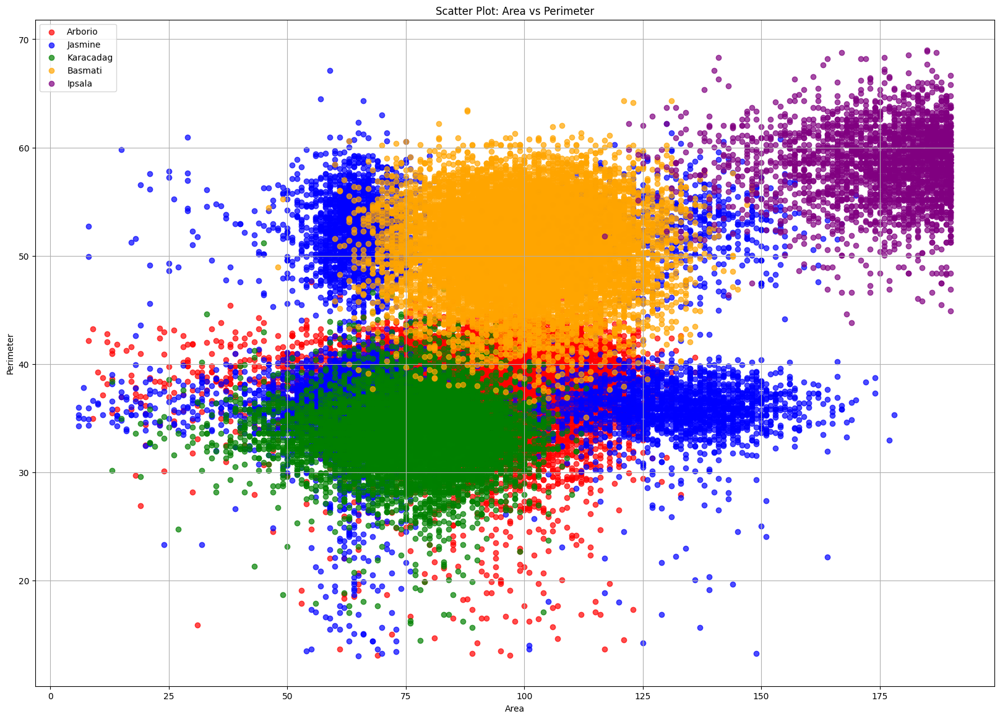

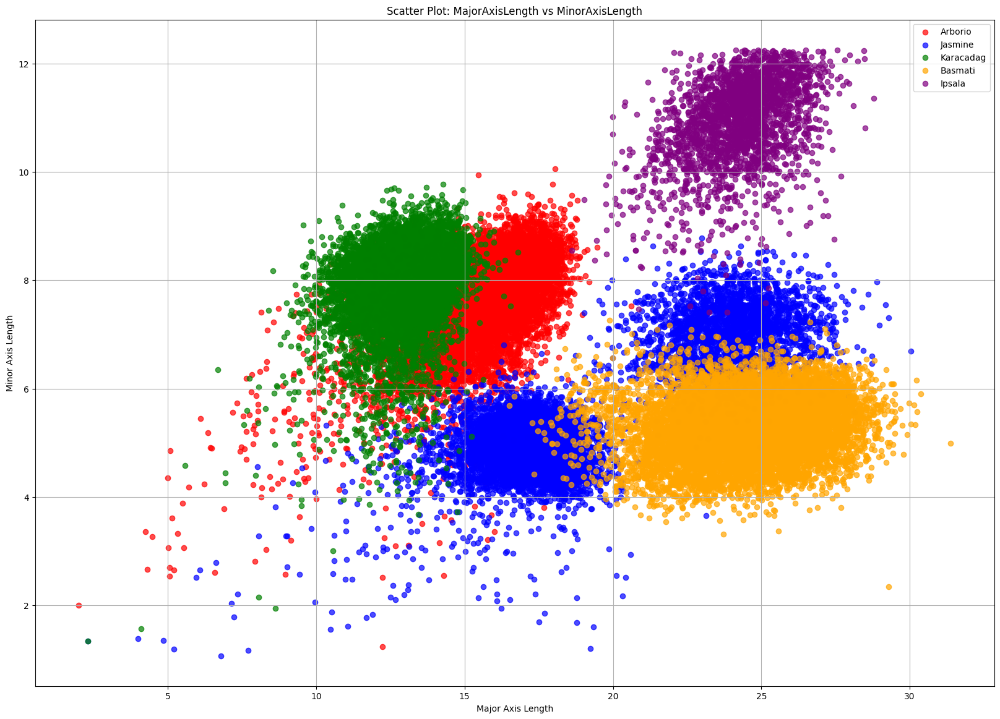

In [236]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming `cleaned_df` is already loaded as a Pandas DataFrame
# Replace `cleaned_df` with the actual DataFrame variable name

# Separate data by labels
labels = cleaned_df['Label'].unique()

# Define colors for each label
colors = ['red', 'blue', 'green', 'orange', 'purple']

# Scatter plot: Area vs Perimeter
plt.figure(figsize=(20, 14))
for i, label in enumerate(labels):
    data = cleaned_df[cleaned_df['Label'] == label]
    plt.scatter(data['Area'], data['Perimeter'], label=f'{class_names[label]}', color=colors[i], alpha=0.7)
plt.title('Scatter Plot: Area vs Perimeter')
plt.xlabel('Area')
plt.ylabel('Perimeter')
plt.legend()
plt.grid(True)
plt.show()

# Scatter plot: MajorAxisLength vs MinorAxisLength
plt.figure(figsize=(20, 14))
for i, label in enumerate(labels):
    data = cleaned_df[cleaned_df['Label'] == label]
    plt.scatter(data['MajorAxisLength'], data['MinorAxisLength'], label=f'{class_names[label]}', color=colors[i], alpha=0.7)
plt.title('Scatter Plot: MajorAxisLength vs MinorAxisLength')
plt.xlabel('Major Axis Length')
plt.ylabel('Minor Axis Length')
plt.legend()
plt.grid(True)
plt.show()


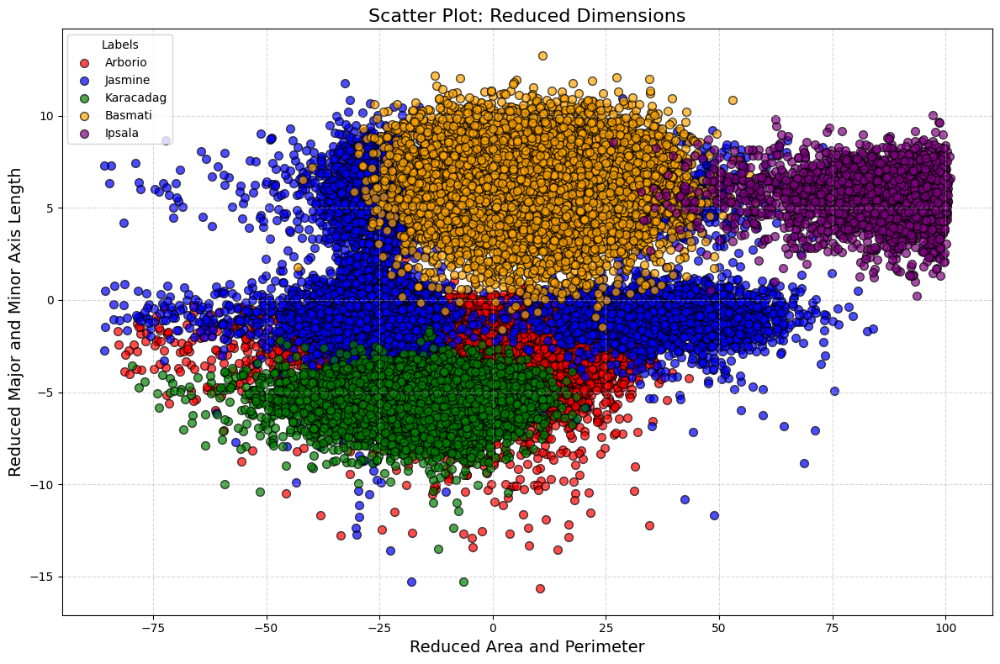

In [235]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def reduce_and_plot(data):
    # Extract the columns for dimensionality reduction
    area_perimeter = data[['Area', 'Perimeter']].values
    major_minor_axis = data[['MajorAxisLength', 'MinorAxisLength']].values
    
    # Apply PCA to reduce dimensions to 1
    pca_area_perimeter = PCA(n_components=1)
    reduced_area_perimeter = pca_area_perimeter.fit_transform(area_perimeter).flatten()
    
    pca_major_minor = PCA(n_components=1)
    reduced_major_minor = pca_major_minor.fit_transform(major_minor_axis).flatten()
    
    # Add the reduced dimensions to the dataframe
    data['Reduced_Area_Perimeter'] = reduced_area_perimeter
    data['Reduced_Major_Minor'] = reduced_major_minor
    
    # Plot the scatter plot with reduced dimensions
    plt.figure(figsize=(12, 8))
    labels = data['Label'].unique()
    colors = ['red', 'blue', 'green', 'orange', 'purple']  # Color for each label
    
    for i, label in enumerate(labels):
        label_data = data[data['Label'] == label]
        plt.scatter(
            label_data['Reduced_Area_Perimeter'], 
            label_data['Reduced_Major_Minor'], 
            label=f'{class_names[label]}', 
            color=colors[i], alpha=0.7, s=50, edgecolor='k'
        )
    
    # Add titles and labels
    plt.title('Scatter Plot: Reduced Dimensions', fontsize=16)
    plt.xlabel('Reduced Area and Perimeter', fontsize=14)
    plt.ylabel('Reduced Major and Minor Axis Length', fontsize=14)
    plt.legend(title="Labels", fontsize=10, loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# Assuming `cleaned_df` is your DataFrame with the relevant columns
reduce_and_plot(cleaned_df)


In [174]:
X_combined_new_train_scaled_after_outlier = cleaned_df.drop(columns=['Label'])
y_train_after_outlier = cleaned_df['Label']

In [175]:
X_combined_new_train_scaled.shape

(50520, 4)

In [176]:
X_combined_new_test_scaled = test_df.drop(columns=['Label'])
y_test = test_df['Label']

In [177]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_squared_error, log_loss

# Initialize and fit the model
linear_model = LinearRegression()
linear_model.fit(X_combined_new_train_scaled_after_outlier , y_train_after_outlier)

# Predictions and evaluatio
train_predictions = linear_model.predict(X_combined_new_train_scaled_after_outlier)
predictions = linear_model.predict(X_combined_new_test_scaled )

mse = mean_squared_error(y_test, predictions)
mse_train = mean_squared_error(y_train_after_outlier, train_predictions)

print(f"Linear Regression - Mean Squared Error for train data: {mse_train:.4f}")
print(f"Linear Regression - Mean Squared Error for test data: {mse:.4f}")

Linear Regression - Mean Squared Error for train data: 1.9899
Linear Regression - Mean Squared Error for test data: 2.2184


In [178]:
from sklearn.linear_model import LogisticRegression

# Initialize and fit the model
logistic_model = LogisticRegression(max_iter=1000)
logistic_model.fit(X_combined_new_train_scaled_after_outlier , y_train_after_outlier)

# Predictions and evaluation
train_predictions = logistic_model.predict(X_combined_new_train_scaled_after_outlier)
predictions = logistic_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train_after_outlier,train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = logistic_model.predict_proba(X_combined_new_train_scaled_after_outlier)
probas = logistic_model.predict_proba(X_combined_new_test_scaled )

mse_train = mean_squared_error(y_train_after_outlier, train_predictions)
mse_test = mean_squared_error(y_test, predictions)


print(f"Logistic Regression - Accuracy for train data: {train_accuracy:.4f},mse_train: {mse_train}")
print(f"Logistic Regression - Accuracy for test data: {accuracy:.4f},mse_test: {mse_test}")

Logistic Regression - Accuracy for train data: 0.9446,mse_train: 0.5968145529650077
Logistic Regression - Accuracy for test data: 0.9013,mse_test: 0.8351333333333333


c:\Users\Ayush Mourya\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [179]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize and fit the KNN model
knn_model = KNeighborsClassifier(n_neighbors=5)  # You can adjust n_neighbors as needed
knn_model.fit(X_combined_new_train_scaled_after_outlier , y_train_after_outlier)

# Predictions and evaluation
train_predictions = knn_model.predict(X_combined_new_train_scaled_after_outlier)
predictions = knn_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train_after_outlier, train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = knn_model.predict_proba(X_combined_new_train_scaled_after_outlier)
probas = knn_model.predict_proba(X_combined_new_test_scaled)

train_loss = log_loss(y_train_after_outlier,train_probas)
loss = log_loss(y_test, probas)

print(f"KNN - Train Accuracy: {train_accuracy:.4f}, Log Loss: {train_loss:.4f}")
print(f"KNN - Test Accuracy: {accuracy:.4f}, Log Loss: {loss:.4f}")


KNN - Train Accuracy: 0.9756, Log Loss: 0.0518
KNN - Test Accuracy: 0.9007, Log Loss: 2.0852


In [ ]:
from sklearn.naive_bayes import GaussianNB

# Initialize and fit the model
naive_bayes_model = GaussianNB()
naive_bayes_model.fit(X_combined_new_train_scaled_after_outlier, y_train_after_outlier)

# Predictions and evaluation
train_predictions = naive_bayes_model.predict(X_combined_new_train_scaled_after_outlier)
predictions = naive_bayes_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train_after_outlier, train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = naive_bayes_model.predict_proba(X_combined_new_train_scaled_after_outlier)
probas = naive_bayes_model.predict_proba(X_combined_new_test_scaled)

train_loss = log_loss(y_train_after_outlier,train_probas)
loss = log_loss(y_test, probas)

print(f"Naive Bayes - Accuracy train: {train_accuracy:.4f}, Log Loss: {train_loss:.4f}")
print(f"Naive Bayes - Accuracy test: {accuracy:.4f}, Log Loss: {loss:.4f}")

Naive Bayes - Accuracy train: 0.9512, Log Loss: 0.1868
Naive Bayes - Accuracy test: 0.8918, Log Loss: 0.4063


In [181]:
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, log_loss

In [183]:
# 4. Decision Tree Classifier
decision_tree_model = DecisionTreeClassifier(random_state=42)
decision_tree_model.fit(X_combined_new_train_scaled_after_outlier, y_train_after_outlier)

dt_train_predictions = decision_tree_model.predict(X_combined_new_train_scaled_after_outlier)
dt_test_predictions = decision_tree_model.predict(X_combined_new_test_scaled)

dt_train_accuracy = accuracy_score(y_train_after_outlier, dt_train_predictions)
dt_test_accuracy = accuracy_score(y_test, dt_test_predictions)

dt_train_probas = decision_tree_model.predict_proba(X_combined_new_train_scaled_after_outlier)
dt_test_probas = decision_tree_model.predict_proba(X_combined_new_test_scaled)

print(f"Decision Tree - Train Accuracy: {dt_train_accuracy:.4f}")
print(f"Decision Tree - Test Accuracy: {dt_test_accuracy:.4f}")

Decision Tree - Train Accuracy: 1.0000
Decision Tree - Test Accuracy: 0.9223


In [185]:
# 3. Random Forest Classifier
random_forest_model = RandomForestClassifier(random_state=42)
random_forest_model.fit(X_combined_new_train_scaled_after_outlier, y_train_after_outlier)

rf_train_predictions = random_forest_model.predict(X_combined_new_train_scaled_after_outlier)
rf_train_accuracy = accuracy_score(y_train_after_outlier, rf_train_predictions)
rf_train_probas = random_forest_model.predict_proba(X_combined_new_train_scaled_after_outlier)
rf_train_loss = log_loss(y_train_after_outlier, rf_train_probas)

rf_test_predictions = random_forest_model.predict(X_combined_new_test_scaled)
rf_test_accuracy = accuracy_score(y_test, rf_test_predictions)
rf_test_probas = random_forest_model.predict_proba(X_combined_new_test_scaled)
rf_test_loss = log_loss(y_test, rf_test_probas)


print(f"Random Forest - Train Accuracy: {rf_train_accuracy:.4f}, Log Loss: {rf_train_loss:.4f}")
print(f"Random Forest - Test Accuracy: {rf_test_accuracy:.4f}, Log Loss: {rf_test_loss:.4f}")

Random Forest - Train Accuracy: 1.0000, Log Loss: 0.0162
Random Forest - Test Accuracy: 0.9261, Log Loss: 0.5447


In [187]:
# 2. MLP (Multilayer Perceptron) Classifier
mlp_model = MLPClassifier(random_state=42, max_iter=500)
mlp_model.fit(X_combined_new_train_scaled_after_outlier, y_train_after_outlier)

mlp_train_predictions = mlp_model.predict(X_combined_new_train_scaled_after_outlier)
mlp_train_accuracy = accuracy_score(y_train_after_outlier, mlp_train_predictions)
mlp_train_probas = mlp_model.predict_proba(X_combined_new_train_scaled_after_outlier)
mlp_train_loss = log_loss(y_train_after_outlier, mlp_train_probas)

mlp_test_predictions = mlp_model.predict(X_combined_new_test_scaled)
mlp_test_accuracy = accuracy_score(y_test, mlp_test_predictions)
mlp_test_probas = mlp_model.predict_proba(X_combined_new_test_scaled)
mlp_test_loss = log_loss(y_test, mlp_test_probas)

print(f"MLP - Train Accuracy: {mlp_train_accuracy:.4f}, Train Log Loss: {mlp_train_loss:.4f}")
print(f"MLP - Test Accuracy: {mlp_test_accuracy:.4f}, Test Log Loss: {mlp_test_loss:.4f}")

MLP - Train Accuracy: 0.9712, Train Log Loss: 0.0849
MLP - Test Accuracy: 0.9169, Test Log Loss: 0.3024


In [202]:

# 1. SVM (Support Vector Machine) Classifier
svm_model = SVC(random_state=42, probability=True)  # Enable probability estimates for log loss
svm_model.fit(X_combined_new_train_scaled_after_outlier, y_train_after_outlier)

svm_train_predictions = svm_model.predict(X_combined_new_train_scaled_after_outlier)
svm_train_accuracy = accuracy_score(y_train_after_outlier, svm_train_predictions)
svm_train_probas = svm_model.predict_proba(X_combined_new_train_scaled_after_outlier)
svm_train_loss = log_loss(y_train_after_outlier, svm_train_probas)


svm_test_predictions = svm_model.predict(X_combined_new_test_scaled)
svm_test_accuracy = accuracy_score(y_test, svm_test_predictions)
svm_test_probas = svm_model.predict_proba(X_combined_new_test_scaled)
svm_test_loss = log_loss(y_test, svm_test_probas)


print(f"SVM - Train Accuracy: {svm_train_accuracy:.4f}, Log Loss: {svm_train_loss:.4f}")
print(f"SVM - Test Accuracy: {svm_test_accuracy:.4f}, Log Loss: {svm_test_loss:.4f}")


SVM - Train Accuracy: 0.9608, Log Loss: 0.1225
SVM - Test Accuracy: 0.8899, Log Loss: 0.3579


Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation
Research Paper implementation


In [ ]:
import numpy as np
from skimage.transform import resize
from skimage.color import rgb2hsv

def extract_color_histogram_batch(dataloader, bins=32):
    color_features_list = []

    for batch_images, batch_labels in dataloader:
        for img in batch_images:
            img_np = img.permute(1, 2, 0).numpy()  # Convert from PyTorch tensor to NumPy array
            img_resized = resize(img_np, (32, 32))  # Resize for consistency

            # Calculate color histogram (assuming the image is in RGB format)
            hist = np.histogram(img_resized, bins=bins, range=(0, 1))[0]
            color_features_list.append(hist)

    return np.array(color_features_list)

# Extract color histograms for training dataset
X_color_train = extract_color_histogram_batch(train_dataloader)

# Extract color histograms for testing dataset (optional)
X_color_test = extract_color_histogram_batch(test_dataloader)


In [ ]:
import numpy as np
from skimage.feature import hog
from skimage.transform import resize

def extract_hog_features_batch(dataloader):
    hog_features_list = []

    for batch_images, batch_labels in dataloader:
        for img in batch_images:
            img_np = img.permute(1, 2, 0).numpy()  # Convert from PyTorch tensor to NumPy array
            if img_np.shape[-1] == 1:
                img_np = img_np.squeeze(axis=-1)  # Remove the channel dimension if grayscale 
            img_resized = resize(img_np, (32, 32))  # Resize the image to a fixed size
            hog_features, hog_image = hog(img_resized, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)
            hog_features_list.append(hog_features)

    return np.array(hog_features_list)

# Extract HOG features for training dataset
X_hog_train = extract_hog_features_batch(train_dataloader)

# Extract HOG features for testing dataset (optional)
X_hog_test = extract_hog_features_batch(test_dataloader)


In [ ]:
import numpy as np
from skimage.filters import sobel
from skimage.transform import resize

def extract_edge_features_batch(dataloader, bins=64):
    edge_features_list = []

    for batch_images, batch_labels in dataloader:
        for img in batch_images:
            img_np = img.permute(1, 2, 0).numpy()  # Convert from PyTorch tensor to NumPy array
            if img_np.shape[-1] == 1:
                img_np = img_np.squeeze(axis=-1)  # Remove channel dimension if grayscale

            img_resized = resize(img_np, (32, 32))  # Resize for consistency

            # Apply Sobel edge detection
            edges = sobel(img_resized)
            edge_hist = np.histogram(edges, bins=bins, range=(0, 1))[0]
            edge_features_list.append(edge_hist)

    return np.array(edge_features_list)

# Extract Sobel edge features for training dataset
X_edge_train = extract_edge_features_batch(train_dataloader)

# Extract Sobel edge features for testing dataset (optional)
X_edge_test = extract_edge_features_batch(test_dataloader)


In [ ]:
import numpy as np
from skimage.feature import local_binary_pattern
from skimage.transform import resize

def extract_lbp_features_batch(dataloader, P=8, R=1, bins=10):
    lbp_features_list = []

    for batch_images, batch_labels in dataloader:
        for img in batch_images:
            img_np = img.permute(1, 2, 0).numpy()  # Convert from PyTorch tensor to NumPy array
            if img_np.shape[-1] == 1:
                img_np = img_np.squeeze(axis=-1)  # Remove channel dimension if grayscale
            
            img_resized = resize(img_np, (32, 32))  # Resize for consistency
            
            # Apply Local Binary Pattern (LBP)
            lbp = local_binary_pattern(img_resized, P=P, R=R, method="uniform")
            
            # Compute the histogram of LBP
            (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, bins + 1), range=(0, bins))
            
            # Normalize the histogram
            hist = hist.astype("float")
            hist /= (hist.sum() + 1e-7)  # Add small value to avoid division by zero
            
            lbp_features_list.append(hist)

    return np.array(lbp_features_list)

# Extract LBP features for training dataset
X_lbp_train = extract_lbp_features_batch(train_dataloader)

# Extract LBP features for testing dataset (optional)
X_lbp_test = extract_lbp_features_batch(test_dataloader)


/home/bhaskar/.local/lib/python3.10/site-packages/skimage/feature/texture.py:360: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


In [ ]:
import numpy as np
from skimage.filters import gabor
from skimage.transform import resize

def extract_gabor_features_batch(dataloader, frequency=0.6):
    gabor_features_list = []

    for batch_images, batch_labels in dataloader:
        for img in batch_images:
            img_np = img.permute(1, 2, 0).numpy()  # Convert from PyTorch tensor to NumPy array
            if img_np.shape[-1] == 1:
                img_np = img_np.squeeze(axis=-1)  # Remove channel dimension if grayscale

            img_resized = resize(img_np, (32, 32))  # Resize for consistency
            
            # Apply Gabor filter with specified frequency
            gabor_mag, _ = gabor(img_resized, frequency=frequency)
            
            # Flatten the Gabor magnitude image to form the feature vector
            gabor_features_list.append(gabor_mag.flatten())

    return np.array(gabor_features_list)

# Extract Gabor features for training dataset
X_gabor_train = extract_gabor_features_batch(train_dataloader)

# Extract Gabor features for testing dataset (optional)
X_gabor_test = extract_gabor_features_batch(test_dataloader)


In [ ]:
from skimage.measure import regionprops
from skimage.segmentation import clear_border
import torch

In [ ]:

def extract_roundness_from_dataloader(dataloader):
    roundness_features = []
    for batch in dataloader:
        images, labels = batch
        batch_roundness = []
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()  # Convert to HWC format
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np  # Handle grayscale
            img_resized = resize(img_np, (32, 32))

            # Thresholding and cleaning
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)

            # Measure roundness
            props = regionprops(binary_img.astype(int))
            if props:
                area = props[0].area
                perimeter = props[0].perimeter
                roundness = (4 * np.pi * area) / (perimeter ** 2) if perimeter != 0 else 0
            else:
                roundness = 0

            batch_roundness.append(roundness)
        roundness_features.extend(batch_roundness)
    return roundness_features

# Extract roundness for all images in dataloader
roundness_features_train = extract_roundness_from_dataloader(train_dataloader)
roundness_features_test = extract_roundness_from_dataloader(test_dataloader)


In [ ]:
def extract_compactness_from_dataloader(dataloader):
    compactness_features = []
    for batch in dataloader:
        images, labels = batch
        batch_compactness = []
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))

            # Thresholding and cleaning
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)

            # Measure compactness
            props = regionprops(binary_img.astype(int))
            if props:
                area = props[0].area
                perimeter = props[0].perimeter
                compactness = (perimeter ** 2) / area if area != 0 else 0
            else:
                compactness = 0

            batch_compactness.append(compactness)
        compactness_features.extend(batch_compactness)
    return compactness_features

# Extract compactness for all images in dataloader
compactness_features_train = extract_compactness_from_dataloader(train_dataloader)
compactness_features_test = extract_compactness_from_dataloader(test_dataloader)


In [ ]:
def extract_shape_factor_3_from_dataloader(dataloader):
    shape_factor_3_features = []
    for batch in dataloader:
        images, labels = batch
        batch_shape_factor_3 = []
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))

            # Thresholding and cleaning
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)

            # Measure shape factor 3
            props = regionprops(binary_img.astype(int))
            if props:
                bbox = props[0].bbox
                width = bbox[3] - bbox[1]
                height = bbox[2] - bbox[0]
                shape_factor_3 = 1 / (width * height) if width != 0 and height != 0 else 0
            else:
                shape_factor_3 = 0

            batch_shape_factor_3.append(shape_factor_3)
        shape_factor_3_features.extend(batch_shape_factor_3)
    return shape_factor_3_features

# Extract shape factor 3 for all images in dataloader
shape_factor_3_features_train = extract_shape_factor_3_from_dataloader(train_dataloader)
shape_factor_3_features_test = extract_shape_factor_3_from_dataloader(test_dataloader)


In [ ]:
def extract_aspect_ratio_from_dataloader(dataloader):
    aspect_ratio_features = []
    for batch in dataloader:
        images, labels = batch
        batch_aspect_ratio = []
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))

            # Thresholding and cleaning
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)

            # Measure aspect ratio
            props = regionprops(binary_img.astype(int))
            if props:
                bbox = props[0].bbox
                width = bbox[3] - bbox[1]
                height = bbox[2] - bbox[0]
                aspect_ratio = width / height if height != 0 else 0
            else:
                aspect_ratio = 0

            batch_aspect_ratio.append(aspect_ratio)
        aspect_ratio_features.extend(batch_aspect_ratio)
    return aspect_ratio_features

# Extract aspect ratio for all images in dataloader
aspect_ratio_features_train = extract_aspect_ratio_from_dataloader(train_dataloader)
aspect_ratio_features_test = extract_aspect_ratio_from_dataloader(test_dataloader)


In [ ]:
def extract_eccentricity_from_dataloader(dataloader):
    eccentricity_features = []
    for batch in dataloader:
        images, labels = batch
        batch_eccentricity = []
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))

            # Thresholding and cleaning
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)

            # Measure eccentricity
            props = regionprops(binary_img.astype(int))
            if props:
                eccentricity = props[0].eccentricity
            else:
                eccentricity = 0

            batch_eccentricity.append(eccentricity)
        eccentricity_features.extend(batch_eccentricity)
    return eccentricity_features

# Extract eccentricity for all images in dataloader
eccentricity_features_train = extract_eccentricity_from_dataloader(train_dataloader)
eccentricity_features_test = extract_eccentricity_from_dataloader(test_dataloader)


In [ ]:
def extract_equivalent_diameter_from_dataloader(dataloader):
    diameter_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                diameter = props[0].equivalent_diameter
                diameter_list.append(diameter)
            else:
                diameter_list.append(0)
    
    return diameter_list

train_equivalent_diameter = extract_equivalent_diameter_from_dataloader(train_dataloader)
test_equivalent_diameter = extract_equivalent_diameter_from_dataloader(test_dataloader)


In [ ]:
def extract_solidity_from_dataloader(dataloader):
    solidity_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                solidity = props[0].solidity
                solidity_list.append(solidity)
            else:
                solidity_list.append(0)
    
    return solidity_list

train_solidity = extract_solidity_from_dataloader(train_dataloader)
test_solidity = extract_solidity_from_dataloader(test_dataloader)


In [ ]:
def extract_convex_area_from_dataloader(dataloader):
    convex_area_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                convex_area = props[0].convex_area
                convex_area_list.append(convex_area)
            else:
                convex_area_list.append(0)
    
    return convex_area_list

train_convex_area = extract_convex_area_from_dataloader(train_dataloader)
test_convex_area = extract_convex_area_from_dataloader(test_dataloader)


In [ ]:
print(len(train_convex_area))

In [ ]:
def extract_extent_from_dataloader(dataloader):
    extent_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                extent = props[0].extent
                extent_list.append(extent)
            else:
                extent_list.append(0)
    
    return extent_list

train_extent = extract_extent_from_dataloader(train_dataloader)
test_extent = extract_extent_from_dataloader(test_dataloader)


In [ ]:
def extract_shape_factor_1_from_dataloader(dataloader):
    shape_factor_1_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                area = props[0].area
                perimeter = props[0].perimeter
                shape_factor_1 = area / (perimeter ** 2) if perimeter != 0 else 0
                shape_factor_1_list.append(shape_factor_1)
            else:
                shape_factor_1_list.append(0)
    
    return shape_factor_1_list

train_shape_factor_1 = extract_shape_factor_1_from_dataloader(train_dataloader)
test_shape_factor_1 = extract_shape_factor_1_from_dataloader(test_dataloader)


In [ ]:
def extract_shape_factor_2_from_dataloader(dataloader):
    shape_factor_2_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                area = props[0].area
                perimeter = props[0].perimeter
                shape_factor_2 = (4 * np.pi * area) / (perimeter ** 2) if perimeter != 0 else 0
                shape_factor_2_list.append(shape_factor_2)
            else:
                shape_factor_2_list.append(0)
    
    return shape_factor_2_list

train_shape_factor_2 = extract_shape_factor_2_from_dataloader(train_dataloader)
test_shape_factor_2 = extract_shape_factor_2_from_dataloader(test_dataloader)


In [ ]:
def extract_shape_factor_4_from_dataloader(dataloader):
    shape_factor_4_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                perimeter = props[0].perimeter
                major_axis_length = props[0].major_axis_length
                shape_factor_4 = perimeter / major_axis_length if major_axis_length != 0 else 0
                shape_factor_4_list.append(shape_factor_4)
            else:
                shape_factor_4_list.append(0)
    
    return shape_factor_4_list

train_shape_factor_4 = extract_shape_factor_4_from_dataloader(train_dataloader)
test_shape_factor_4 = extract_shape_factor_4_from_dataloader(test_dataloader)


In [ ]:
def extract_shape_factor_5_from_dataloader(dataloader):
    shape_factor_5_list = []
    
    for batch in dataloader:
        images, labels = batch
        for img_tensor in images:
            img_np = img_tensor.permute(1, 2, 0).numpy()
            img_np = img_np.squeeze() if img_np.shape[-1] == 1 else img_np
            img_resized = resize(img_np, (32, 32))
            
            binary_img = img_resized > 0.5
            binary_img = clear_border(binary_img)
            
            props = regionprops(binary_img.astype(int))
            if props:
                area = props[0].area
                major_axis_length = props[0].major_axis_length
                minor_axis_length = props[0].minor_axis_length
                shape_factor_5 = area / (major_axis_length * minor_axis_length) if major_axis_length != 0 and minor_axis_length != 0 else 0
                shape_factor_5_list.append(shape_factor_5)
            else:
                shape_factor_5_list.append(0)
    
    return shape_factor_5_list

train_shape_factor_5 = extract_shape_factor_5_from_dataloader(train_dataloader)
test_shape_factor_5 = extract_shape_factor_5_from_dataloader(test_dataloader)


In [ ]:
X_combined_new_train = np.column_stack((
    X_color_train,X_edge_train,X_hog_train,X_gabor_train,X_lbp_train,
    roundness_features_train, compactness_features_train, aspect_ratio_features_train, 
    eccentricity_features_train, train_area, train_perimeter, 
    train_major_axis_length, train_minor_axis_length, 
    train_equivalent_diameter, train_solidity, 
    train_convex_area, train_extent, train_shape_factor_1, 
    train_shape_factor_2, shape_factor_3_features_train, 
    train_shape_factor_4, train_shape_factor_5
))

In [ ]:
# Combine training features
X_combined_new_train = np.column_stack((
    X_color_train,X_edge_train,X_hog_train,X_gabor_train,X_lbp_train,
    roundness_features_train, compactness_features_train, aspect_ratio_features_train, 
    eccentricity_features_train, train_area, train_perimeter, 
    train_major_axis_length, train_minor_axis_length, 
    train_equivalent_diameter, train_solidity, 
    train_convex_area, train_extent, train_shape_factor_1, 
    train_shape_factor_2, shape_factor_3_features_train, 
    train_shape_factor_4, train_shape_factor_5
))


In [ ]:
# Combine testing features
X_combined_new_test = np.column_stack((
    X_color_test,X_edge_test,X_hog_test,X_gabor_test,X_lbp_test,
    roundness_features_test, compactness_features_test, aspect_ratio_features_test, 
    eccentricity_features_test, test_area, test_perimeter, 
    test_major_axis_length, test_minor_axis_length, 
    test_equivalent_diameter, test_solidity, 
    test_convex_area, test_extent, test_shape_factor_1, 
    test_shape_factor_2, shape_factor_3_features_test, 
    test_shape_factor_4, test_shape_factor_5
))

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_combined_new_train_scaled = scaler.fit_transform(X_combined_new_train)
X_combined_new_test_scaled = scaler.transform(X_combined_new_test)


In [ ]:
import pickle

# Save with Pickle
with open('X_combined_new_train_scaled.pkl', 'wb') as f:
    pickle.dump(X_combined_new_train_scaled, f)

with open('X_combined_new_test_scaled.pkl', 'wb') as f:
    pickle.dump(X_combined_new_test_scaled, f)


In [2]:
import pickle

In [4]:
# To load the datasets later
with open('X_combined_new_train_scaled.pkl', 'rb') as f:
    X_combined_new_train_scaled = pickle.load(f)

with open('X_combined_new_test_scaled.pkl', 'rb') as f:
    X_combined_new_test_scaled = pickle.load(f)

In [8]:
X_combined_new_train_scaled.shape

(60000, 1471)

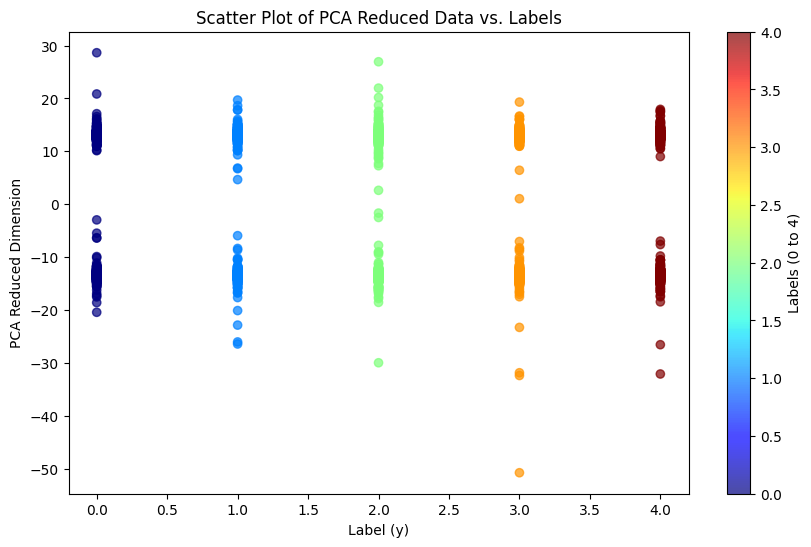

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming you have the following arrays:
# X: the first numpy array of shape (60000, 1471)
# y: the second numpy array of shape (60000,) containing values from 0 to 4

# Step 1: Apply PCA to reduce the dimensionality of X to 1D
pca = PCA(n_components=1)
X_reduced = pca.fit_transform(X_combined_new_train_scaled)

# Step 2: Set up the plot
plt.figure(figsize=(10, 6))

# Step 3: Create the scatter plot
scatter = plt.scatter(y_train, X_reduced, c=y_train, cmap='jet', alpha=0.7)

# Step 4: Add color legend for labels 0-4
plt.colorbar(scatter, label='Labels (0 to 4)')

# Step 5: Label the axes
plt.xlabel('Label (y)')
plt.ylabel('PCA Reduced Dimension')

# Step 6: Show the plot
plt.title('Scatter Plot of PCA Reduced Data vs. Labels')
plt.show()


In [30]:
import numpy as np

# Assuming:
# X_train: NumPy array of shape (60000, 1471) containing the data.
# y_train: NumPy array of shape (60000,) containing labels (0 to 4).

# Filter the data for each class
class_0 = X_combined_new_train_scaled[y_train == 0]  # Data where label is 0
class_1 = X_combined_new_train_scaled[y_train == 1]  # Data where label is 1
class_2 = X_combined_new_train_scaled[y_train == 2]  # Data where label is 2
class_3 = X_combined_new_train_scaled[y_train == 3]  # Data where label is 3
class_4 = X_combined_new_train_scaled[y_train == 4]  # Data where label is 4

# Print the shape of each class-specific array
print("Class 0 shape:", class_0.shape)
print("Class 1 shape:", class_1.shape)
print("Class 2 shape:", class_2.shape)
print("Class 3 shape:", class_3.shape)
print("Class 4 shape:", class_4.shape)


Class 0 shape: (12000, 1471)
Class 1 shape: (12000, 1471)
Class 2 shape: (12000, 1471)
Class 3 shape: (12000, 1471)
Class 4 shape: (12000, 1471)


In [48]:
import numpy as np

# Select 100 samples from each class
#np.random.seed(42)  # For reproducibility
sample_size = 100

class_0_sample = class_0[:sample_size]
class_1_sample = class_1[:sample_size]
class_2_sample = class_2[:sample_size]
class_3_sample = class_3[:sample_size]
class_4_sample = class_4[:sample_size]

# Concatenate samples row-wise to form the smaller dataset
X_svm_small = np.vstack((class_0_sample, class_1_sample, class_2_sample, class_3_sample, class_4_sample))

# Create labels for the smaller dataset
y_svm_small = np.array([0] * sample_size + [1] * sample_size + [2] * sample_size + [3] * sample_size + [4] * sample_size)

# Print the shape of the smaller dataset
print("Small Dataset Shape (X):", X_svm_small.shape)
print("Small Dataset Labels Shape (y):", y_svm_small.shape)

# Verify counts in each class
for i in range(5):
    print(f"Class {i} count in y_svm_small:", np.sum(y_svm_small == i))


Small Dataset Shape (X): (500, 2)
Small Dataset Labels Shape (y): (500,)
Class 0 count in y_svm_small: 100
Class 1 count in y_svm_small: 100
Class 2 count in y_svm_small: 100
Class 3 count in y_svm_small: 100
Class 4 count in y_svm_small: 100


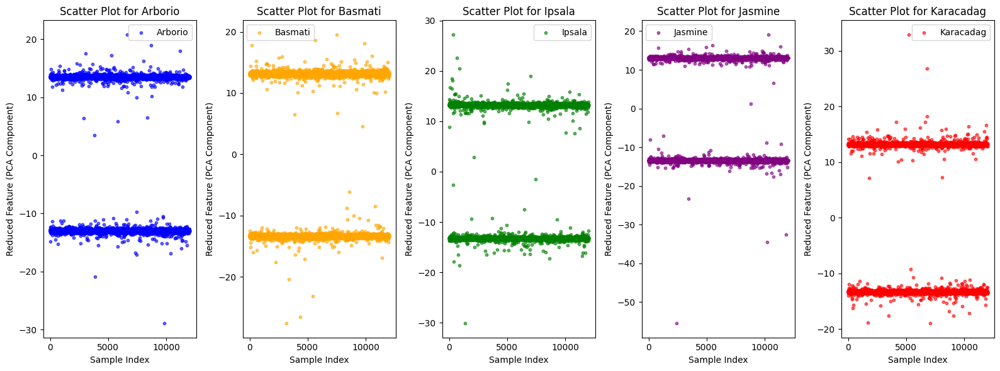

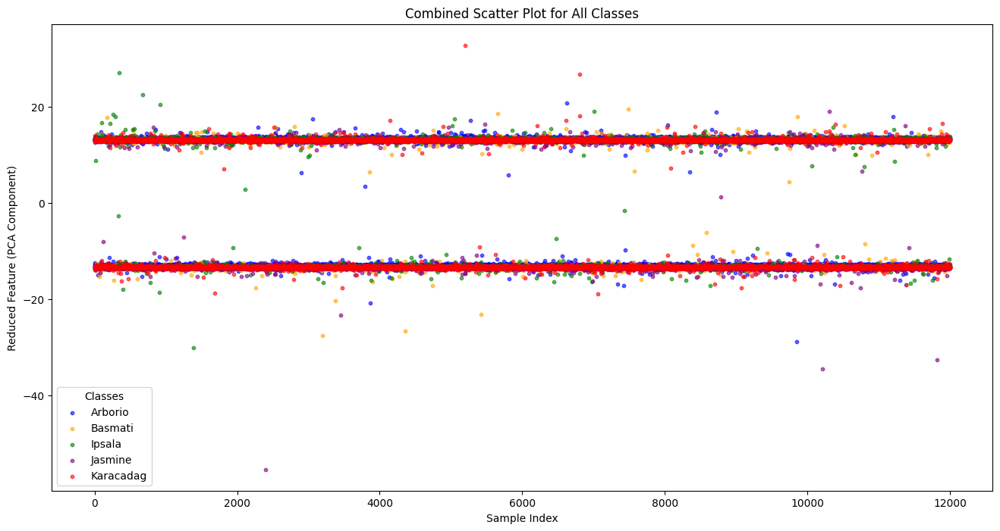

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA  # For dimensionality reduction

# Assuming class_0 to class_4 are already defined
classes = [class_0, class_1, class_2, class_3, class_4]
colors = ['blue', 'orange', 'green', 'purple', 'red']
labels = ['Arborio', 'Basmati', 'Ipsala', 'Jasmine', 'Karacadag']

# Prepare the x-axis for each label (1 to 12000 for each class)
x_axes = np.arange(1, 12001)

# Reduce dimensionality of each class to 1 dimension
reduced_classes = []
pca = PCA(n_components=1)  # Using PCA for reduction
for class_data in classes:
    reduced_class = pca.fit_transform(class_data).flatten()  # Flatten to 1D
    reduced_classes.append(reduced_class)

# Create subplots for separate scatter plots
fig, axes = plt.subplots(1, 5, figsize=(16, 6), sharex=True)
for i, (reduced_class, color, label) in enumerate(zip(reduced_classes, colors, labels)):
    axes[i].scatter(x_axes, reduced_class, color=color, label=label, alpha=0.6, s=10)
    axes[i].set_title(f"Scatter Plot for {label}")
    axes[i].set_xlabel("Sample Index")
    axes[i].set_ylabel("Reduced Feature (PCA Component)")
    axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

# Plot combined scatter plot for all classes
plt.figure(figsize=(16, 8))
for i, (reduced_class, color, label) in enumerate(zip(reduced_classes, colors, labels)):
    plt.scatter(x_axes, reduced_class, color=color, label=label, alpha=0.6, s=10)

# Add labels and legend
plt.xlabel("Sample Index")
plt.ylabel("Reduced Feature (PCA Component)")
plt.title("Combined Scatter Plot for All Classes")
plt.legend(title="Classes")
plt.show()


In [41]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_squared_error, log_loss

# Initialize and fit the model
linear_model = LinearRegression()
linear_model.fit(X_combined_new_train_scaled , y_train)

# Predictions and evaluatio
train_predictions = linear_model.predict(X_combined_new_train_scaled)
predictions = linear_model.predict(X_combined_new_test_scaled )
mse = mean_squared_error(y_test, predictions)
mse_train = mean_squared_error(y_train, train_predictions)
print(f"Linear Regression - Mean Squared Error for train data: {mse_train:.4f}")
print(f"Linear Regression - Mean Squared Error for test data: {mse:.4f}")

Linear Regression - Mean Squared Error for train data: 1.9501
Linear Regression - Mean Squared Error for test data: 15698261.9315


In [ ]:
from sklearn.linear_model import LogisticRegression

# Initialize and fit the model
logistic_model = LogisticRegression(max_iter=1000)
logistic_model.fit(X_combined_new_train_scaled , y_train)

# Predictions and evaluation
train_predictions = logistic_model.predict(X_combined_new_train_scaled )
predictions = logistic_model.predict(X_combined_new_test_scaled )

train_accuracy = accuracy_score(y_train,train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = logistic_model.predict_proba(X_combined_new_train_scaled)
probas = logistic_model.predict_proba(X_combined_new_test_scaled )

loss_train = log_loss(y_train,train_probas)
loss = log_loss(y_test, probas)

print(f"Logistic Regression - Accuracy for train data: {train_accuracy:.4f}, Log Loss: {loss_train:.4f}")
print(f"Logistic Regression - Accuracy for test data: {accuracy:.4f}, Log Loss: {loss:.4f}")

c:\Users\Ayush Mourya\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression - Accuracy for train data: 0.2752, Log Loss: 1.5697
Logistic Regression - Accuracy for test data: 0.2236, Log Loss: 1.6434


In [ ]:
from sklearn.naive_bayes import GaussianNB

# Initialize and fit the model
naive_bayes_model = GaussianNB()
naive_bayes_model.fit(X_combined_new_train_scaled, y_train)

# Predictions and evaluation
train_predictions = naive_bayes_model.predict(X_combined_new_train_scaled)
predictions = naive_bayes_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train, train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = naive_bayes_model.predict_proba(X_combined_new_train_scaled)
probas = naive_bayes_model.predict_proba(X_combined_new_test_scaled)

train_loss = log_loss(y_train,train_probas)
loss = log_loss(y_test, probas)

print(f"Naive Bayes - Accuracy train: {train_accuracy:.4f}, Log Loss: {train_loss:.4f}")
print(f"Naive Bayes - Accuracy: {accuracy:.4f}, Log Loss: {loss:.4f}")

Naive Bayes - Accuracy train: 0.2113, Log Loss: 15.8304
Naive Bayes - Accuracy: 0.2595, Log Loss: 16.9667


In [ ]:
from sklearn.tree import DecisionTreeClassifier

# Initialize and fit the model
decision_tree_model = DecisionTreeClassifier()
decision_tree_model.fit(X_combined_new_train_scaled , y_train)

# Predictions and evaluation
predictions = decision_tree_model.predict(X_combined_new_test_scaled )
train_predictions = decision_tree_model.predict(X_combined_new_train_scaled)

train_accuracy = accuracy_score(y_train,train_predictions)
accuracy = accuracy_score(y_test, predictions)

trainn_probas = decision_tree_model.predict_proba(X_combined_new_train_scaled)
probas = decision_tree_model.predict_proba(X_combined_new_test_scaled )

train_loss = log_loss(y_train,train_probas)
loss = log_loss(y_test, probas)

print(f"Decision Tree - Accuracy trian: {train_accuracy:.4f}, Log Loss: {train_loss:.4f}")
print(f"Decision Tree - Accuracy: {accuracy:.4f}, Log Loss: {loss:.4f}")

Decision Tree - Accuracy trian: 1.0000, Log Loss: 15.8304
Decision Tree - Accuracy: 0.2033, Log Loss: 28.7148


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, mean_squared_error, log_loss
# Initialize and fit the model
random_forest_model = RandomForestClassifier()
random_forest_model.fit(X_combined_new_train_scaled, y_train)

# Predictions and evaluation
train_predictions = random_forest_model.predict(X_combined_new_train_scaled)
predictions = random_forest_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train, train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = random_forest_model.predict_proba(X_combined_new_train_scaled)
probas = random_forest_model.predict_proba(X_combined_new_test_scaled)

train_loss = log_loss(y_train,train_probas)
loss = log_loss(y_test, probas)

print(f"Random Forest - Train Accuracy: {train_accuracy:.4f}, Log Loss: {train_loss:.4f}")
print(f"Random Forest - Accuracy: {accuracy:.4f}, Log Loss: {loss:.4f}")

Random Forest - Train Accuracy: 1.0000, Log Loss: 0.3508
Random Forest - Accuracy: 0.1921, Log Loss: 1.6433


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# Initialize and fit the KNN model
knn_model = KNeighborsClassifier(n_neighbors=5)  # You can adjust n_neighbors as needed
knn_model.fit(X_combined_new_train_scaled , y_train)

# Predictions and evaluation
train_predictions = knn_model.predict(X_combined_new_train_scaled)
predictions = knn_model.predict(X_combined_new_test_scaled)

train_accuracy = accuracy_score(y_train, train_predictions)
accuracy = accuracy_score(y_test, predictions)

train_probas = knn_model.predict_proba(X_combined_new_train_scaled)
probas = knn_model.predict_proba(X_combined_new_test_scaled)

train_loss = log_loss(y_train,train_probas)
loss = log_loss(y_test, probas)

print(f"KNN - Train Accuracy: {train_accuracy:.4f}, Log Loss: {train_loss:.4f}")
print(f"KNN - Accuracy: {accuracy:.4f}, Log Loss: {loss:.4f}")


KNN - Train Accuracy: 0.4554, Log Loss: 1.1191
KNN - Accuracy: 0.1868, Log Loss: 13.4604


In [43]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, log_loss
from xgboost import XGBClassifier
from skopt import BayesSearchCV

# Function for Bayesian Optimization
def bayesian_search_rf(X_train, y_train):
    param_grid_rf = {
        'n_estimators': (200, 500)
    }
    rf_model = RandomForestClassifier(random_state=42)
    bayes_rf = BayesSearchCV(
        rf_model, param_grid_rf, n_iter=32, scoring='accuracy', cv=3, random_state=42
    )
    bayes_rf.fit(X_train, y_train)
    return bayes_rf.best_estimator_

def bayesian_search_xgb(X_train, y_train):
    param_grid_xgb = {
        'n_estimators': (200, 500)
    }
    xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
    bayes_xgb = BayesSearchCV(
        xgb_model, param_grid_xgb, n_iter=32, scoring='accuracy', cv=3, random_state=42
    )
    bayes_xgb.fit(X_train, y_train)
    return bayes_xgb.best_estimator_

# Fit Random Forest with Bayesian Optimization
optimized_rf = bayesian_search_rf(X_combined_new_train_scaled, y_train)
optimized_rf.fit(X_combined_new_train_scaled, y_train)

# Predictions for Random Forest
rf_train_predictions = optimized_rf.predict(X_combined_new_train_scaled)
rf_predictions = optimized_rf.predict(X_combined_new_test_scaled)

rf_train_probas = optimized_rf.predict_proba(X_combined_new_train_scaled)
rf_probas = optimized_rf.predict_proba(X_combined_new_test_scaled)

rf_train_accuracy = accuracy_score(y_train, rf_train_predictions)
rf_accuracy = accuracy_score(y_test, rf_predictions)

rf_train_loss = log_loss(y_train, rf_train_probas)
rf_loss = log_loss(y_test, rf_probas)

print(f"Optimized Random Forest - Train Accuracy: {rf_train_accuracy:.4f}, Log Loss: {rf_train_loss:.4f}")
print(f"Optimized Random Forest - Accuracy: {rf_accuracy:.4f}, Log Loss: {rf_loss:.4f}")

# Fit XGBoost with Bayesian Optimization
optimized_xgb = bayesian_search_xgb(X_combined_new_train_scaled, y_train)
optimized_xgb.fit(X_combined_new_train_scaled, y_train)

# Predictions for XGBoost
xgb_train_predictions = optimized_xgb.predict(X_combined_new_train_scaled)
xgb_predictions = optimized_xgb.predict(X_combined_new_test_scaled)

xgb_train_probas = optimized_xgb.predict_proba(X_combined_new_train_scaled)
xgb_probas = optimized_xgb.predict_proba(X_combined_new_test_scaled)

xgb_train_accuracy = accuracy_score(y_train, xgb_train_predictions)
xgb_accuracy = accuracy_score(y_test, xgb_predictions)

xgb_train_loss = log_loss(y_train, xgb_train_probas)
xgb_loss = log_loss(y_test, xgb_probas)

print(f"Optimized XGBoost - Train Accuracy: {xgb_train_accuracy:.4f}, Log Loss: {xgb_train_loss:.4f}")
print(f"Optimized XGBoost - Accuracy: {xgb_accuracy:.4f}, Log Loss: {xgb_loss:.4f}")


KeyboardInterrupt: 

In [2]:
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, log_loss

In [ ]:


# Train and evaluate MLP Classifier
mlp_model = MLPClassifier(random_state=42, max_iter=500)  # Default MLP settings
mlp_model.fit(X_combined_new_train_scaled, y_train)
mlp_train_predictions = mlp_model.predict(X_combined_new_train_scaled)
mlp_test_predictions = mlp_model.predict(X_combined_new_test_scaled)
mlp_train_probas = mlp_model.predict_proba(X_combined_new_train_scaled)
mlp_test_probas = mlp_model.predict_proba(X_combined_new_test_scaled)

mlp_train_acc = accuracy_score(y_train, mlp_train_predictions)
mlp_test_acc = accuracy_score(y_test, mlp_test_predictions)
mlp_train_loss = log_loss(y_train, mlp_train_probas)
mlp_test_loss = log_loss(y_test, mlp_test_probas)

print(f"MLP - Train Accuracy: {mlp_train_acc:.4f}, Log Loss: {mlp_train_loss:.4f}")
print(f"MLP - Test Accuracy: {mlp_test_acc:.4f}, Log Loss: {mlp_test_loss:.4f}")

# Train and evaluate XGBoost Classifier
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric="mlogloss")  # Default XGBoost settings
xgb_model.fit(X_combined_new_train_scaled, y_train)
xgb_train_predictions = xgb_model.predict(X_combined_new_train_scaled)
xgb_test_predictions = xgb_model.predict(X_combined_new_test_scaled)
xgb_train_probas = xgb_model.predict_proba(X_combined_new_train_scaled)
xgb_test_probas = xgb_model.predict_proba(X_combined_new_test_scaled)

xgb_train_acc = accuracy_score(y_train, xgb_train_predictions)
xgb_test_acc = accuracy_score(y_test, xgb_test_predictions)
xgb_train_loss = log_loss(y_train, xgb_train_probas)
xgb_test_loss = log_loss(y_test, xgb_test_probas)

print(f"XGBoost - Train Accuracy: {xgb_train_acc:.4f}, Log Loss: {xgb_train_loss:.4f}")
print(f"XGBoost - Test Accuracy: {xgb_test_acc:.4f}, Log Loss: {xgb_test_loss:.4f}")


MLP - Train Accuracy: 0.8774, Log Loss: 0.3385
MLP - Test Accuracy: 0.1804, Log Loss: 8.7799


In [3]:
# Train and evaluate SVM Classifier
svm_model = SVC(random_state=42, probability=True)  # Default SVM settings
svm_model.fit(X_combined_new_train_scaled[:100], y_train[:100])
svm_train_predictions = svm_model.predict(X_combined_new_train_scaled)
svm_test_predictions = svm_model.predict(X_combined_new_test_scaled)
svm_train_probas = svm_model.predict_proba(X_combined_new_train_scaled)
svm_test_probas = svm_model.predict_proba(X_combined_new_test_scaled)

svm_train_acc = accuracy_score(y_train, svm_train_predictions)
svm_test_acc = accuracy_score(y_test, svm_test_predictions)
svm_train_loss = log_loss(y_train, svm_train_probas)
svm_test_loss = log_loss(y_test, svm_test_probas)

print(f"SVM - Train Accuracy: {svm_train_acc:.4f}, Log Loss: {svm_train_loss:.4f}")
print(f"SVM - Test Accuracy: {svm_test_acc:.4f}, Log Loss: {svm_test_loss:.4f}")


NameError: name 'X_combined_new_train_scaled' is not defined